In [1]:
import pandas as pd
import plotly.graph_objects as go
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import numpy as np
warnings.filterwarnings("ignore")
plt.style.use('ggplot')
pd.set_option('display.max_columns', None)

from dash import Dash, html, dcc
from jupyter_dash import JupyterDash
from dash.dependencies import Output, Input
from dash.exceptions import PreventUpdate

In [2]:
data = pd.read_csv('Crime_Data_from_2020_to_Present.csv')

data.head()

,DR_NO,Date Rptd,DATE OCC,TIME OCC,AREA,AREA NAME,Rpt Dist No,Part 1-2,Crm Cd,Crm Cd Desc,Mocodes,Vict Age,Vict Sex,Vict Descent,Premis Cd,Premis Desc,Weapon Used Cd,Weapon Desc,Status,Status Desc,Crm Cd 1,Crm Cd 2,Crm Cd 3,Crm Cd 4,LOCATION,Cross Street,LAT,LON
0,10304468,01/08/2020 12:00:00 AM,01/08/2020 12:00:00 AM,2230,3,Southwest,377,2,624,BATTERY - SIMPLE ASSAULT,0444 0913,36,F,B,501.0,SINGLE FAMILY DWELLING,400.0,"STRONG-ARM (HANDS, FIST, FEET OR BODILY FORCE)",AO,Adult Other,624.0,NaN,NaN,NaN,1100 W 39TH PL,NaN,34.0141,-118.2978
1,190101086,01/02/2020 12:00:00 AM,01/01/2020 12:00:00 AM,330,1,Central,163,2,624,BATTERY - SIMPLE ASSAULT,0416 1822 1414,25,M,H,102.0,SIDEWALK,500.0,UNKNOWN WEAPON/OTHER WEAPON,IC,Invest Cont,624.0,NaN,NaN,NaN,700 S HILL ST,NaN,34.0459,-118.2545
2,200110444,04/14/2020 12:00:00 AM,02/13/2020 12:00:00 AM,1200,1,Central,155,2,845,SEX OFFENDER REGISTRANT OUT OF COMPLIANCE,1501,0,X,X,726.0,POLICE FACILITY,NaN,NaN,AA,Adult Arrest,845.0,NaN,NaN,NaN,200 E 6TH ST,NaN,34.0448,-118.2474
3,191501505,01/01/2020 12:00:00 AM,01/01/2020 12:00:00 AM,1730,15,N Hollywood,1543,2,745,VANDALISM - MISDEAMEANOR ($399 OR UNDER),0329 1402,76,F,W,502.0,"MULTI-UNIT DWELLING (APARTMENT, DUPLEX, ETC)",NaN,NaN,IC,Invest Cont,745.0,998.0,NaN,NaN,5400 CORTEEN PL,NaN,34.1685,-118.4019
4,191921269,01/01/2020 12:00:00 AM,01/01/2020 12:00:00 AM,415,19,Mission,1998,2,740,"VANDALISM - FELONY ($400 & OVER, ALL CHURCH VA...",0329,31,X,X,409.0,BEAUTY SUPPLY STORE,NaN,NaN,IC,Invest Cont,740.0,NaN,NaN,NaN,14400 TITUS ST,NaN,34.2198,-118.4468


In [3]:
data[:20].to_csv('la_crime.csv')

In [4]:
data.shape

(788767, 28)

In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 788767 entries, 0 to 788766
Data columns (total 28 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   DR_NO           788767 non-null  int64  
 1   Date Rptd       788767 non-null  object 
 2   DATE OCC        788767 non-null  object 
 3   TIME OCC        788767 non-null  int64  
 4   AREA            788767 non-null  int64  
 5   AREA NAME       788767 non-null  object 
 6   Rpt Dist No     788767 non-null  int64  
 7   Part 1-2        788767 non-null  int64  
 8   Crm Cd          788767 non-null  int64  
 9   Crm Cd Desc     788767 non-null  object 
 10  Mocodes         680162 non-null  object 
 11  Vict Age        788767 non-null  int64  
 12  Vict Sex        685415 non-null  object 
 13  Vict Descent    685407 non-null  object 
 14  Premis Cd       788758 non-null  float64
 15  Premis Desc     788300 non-null  object 
 16  Weapon Used Cd  274517 non-null  float64
 17  Weapon Des

In [6]:
data.isna().sum()

DR_NO                  0
Date Rptd              0
DATE OCC               0
TIME OCC               0
AREA                   0
AREA NAME              0
Rpt Dist No            0
Part 1-2               0
Crm Cd                 0
Crm Cd Desc            0
Mocodes           108605
Vict Age               0
Vict Sex          103352
Vict Descent      103360
Premis Cd              9
Premis Desc          467
Weapon Used Cd    514250
Weapon Desc       514250
Status                 0
Status Desc            0
Crm Cd 1              10
Crm Cd 2          730596
Crm Cd 3          786831
Crm Cd 4          788710
LOCATION               0
Cross Street      662358
LAT                    0
LON                    0
dtype: int64

In [7]:
#Datetime

In [8]:
for x in ['Date Rptd', 'DATE OCC']:
    data[x] = pd.to_datetime(data[x])

In [9]:
#Vict Sex

In [10]:
data['Vict Sex'].unique()

array(['F', 'M', 'X', nan, 'H', '-'], dtype=object)

In [11]:
data['Vict Sex'] = data['Vict Sex'].str.replace('X', 'Unknown').replace('-', 'Unknown').replace('H', 'Unknown')

In [12]:
data['Vict Sex'].fillna('Unknown', inplace=True)

In [13]:
#Age

In [14]:
data['Vict Age'].unique()

array([ 36,  25,   0,  76,  31,  23,  29,  35,  41,  24,  34,  46,  66,
        40,  27,  62,  43,  71,  50,  19,  51,  33,  69,  39,  57,  78,
        52,  38,  55,  44,  18,  54,  22,  28,  42,  56,  67,  37,  60,
        61,  59,  32,  30,  45,  20,  15,  58,  47,  48,  26,  21,  64,
        75,  12,  49,  68,  14,  13,  10,  53,  74,  17,  65,  63,   8,
        16,  72,  70,   9,  90,  85,  81,  79,  94,  73,  11,  80,   5,
        82,   2,  77,  84,  88,  96,  99,  86,   7,  92,   3,  83,  87,
         6,  -1,  89,   4,  93,  98,  91,  95,  -2,  97, 120,  -3])

In [15]:
data['Vict Age'] = data['Vict Age'].replace(0, round(data['Vict Age'].mean()))

In [16]:
for x in data['Vict Age']:
    if x < 0:
        data['Vict Age'] = data['Vict Age'].replace(x, round(data['Vict Age'].mean()))

In [17]:
#Vict Descent

In [18]:
data['Vict Descent'].unique()

array(['B', 'H', 'X', 'W', 'A', 'O', nan, 'C', 'F', 'K', 'I', 'V', 'Z',
       'J', 'P', 'S', 'G', 'U', 'D', 'L', '-'], dtype=object)

In [19]:
data['Vict Descent'].fillna('Unknown', inplace=True)

In [20]:
def race(data):
    blanks = []
    for x in data['Vict Descent']:
        if x == 'B':
            blanks.append('Black')
        elif x == 'H':
            blanks.append('Hispanic/Latin/Mexican')
        elif x == 'X':
            blanks.append('Unknown')
        elif x == '-':
            blanks.append('Unknown')
        elif x == 'W':
            blanks.append('White')
        elif x == 'A':
            blanks.append('Asian')
        elif x == 'O':
            blanks.append('Other')
        elif x == 'C':
            blanks.append('Chinese')
        elif x == 'F':
            blanks.append('Filipino')
        elif x == 'K':
            blanks.append('Korean')
        elif x == 'I':
            blanks.append('American Indian/Alaskan Native')
        elif x == 'V':
            blanks.append('Vietnamese')
        elif x == 'Z':
            blanks.append('Asian Indian')
        elif x == 'J':
            blanks.append('Japanese')
        elif x == 'P':
            blanks.append('Pacific Islanders')
        elif x == 'S':
            blanks.append('Samoan')
        elif x == 'G':
            blanks.append('Guamanian')
        elif x == 'U':
            blanks.append('Hawaiian')
        elif x == 'D':
            blanks.append('Cambodian')
        elif x == 'L':
            blanks.append('Laotian')
        else:
            blanks.append('Unknown')
            
    return blanks

In [21]:
data['Vict Descent'] = race(data)

In [22]:
#Mocodes

In [23]:
data['Mocodes'].fillna('Unknown', inplace=True)

In [24]:
data.fillna('Unknown', inplace=True)

In [25]:
data.duplicated().sum()

0

In [26]:
#Crime DESC categorization (chatgpt)

In [27]:
crime_category_dict = {
    'BATTERY - SIMPLE ASSAULT': 'Violent Crimes',
    'SEX OFFENDER REGISTRANT OUT OF COMPLIANCE': 'Sex Crimes',
    'VANDALISM - MISDEMEANOR ($399 OR UNDER)': 'Property Crimes',
    'VANDALISM - FELONY ($400 & OVER, ALL CHURCH VANDALISMS)': 'Property Crimes',
    'RAPE, FORCIBLE': 'Violent Crimes',
    'SHOPLIFTING - PETTY THEFT ($950 & UNDER)': 'Property Crimes',
    'OTHER MISCELLANEOUS CRIME': 'Crimes Against Persons or Public Order',
    'THEFT-GRAND ($950.01 & OVER)EXCPT,GUNS,FOWL,LIVESTK,PROD': 'Property Crimes',
    'BURGLARY FROM VEHICLE': 'Property Crimes',
    'CRIMINAL THREATS - NO WEAPON DISPLAYED': 'Crimes Against Persons or Public Order',
    'ARSON': 'Crimes Against Persons or Public Order',
    'INTIMATE PARTNER - SIMPLE ASSAULT': 'Crimes Against Persons or Public Order',
    'THEFT PLAIN - PETTY ($950 & UNDER)': 'Property Crimes',
    'THEFT OF IDENTITY': 'Property Crimes',
    'ROBBERY': 'Violent Crimes',
    'ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT': 'Violent Crimes',
    'BURGLARY': 'Property Crimes',
    'VEHICLE - STOLEN': 'Crimes Against Property and Vehicles',
    'THEFT FROM MOTOR VEHICLE - PETTY ($950 & UNDER)': 'Property Crimes',
    'BRANDISH WEAPON': 'Crimes Involving Weapons',
    'INTIMATE PARTNER - AGGRAVATED ASSAULT': 'Violent Crimes',
    'BUNCO, GRAND THEFT': 'Financial Crimes',
    'THEFT, PERSON': 'Property Crimes',
    'BATTERY WITH SEXUAL CONTACT': 'Sex Crimes',
    'BIKE - STOLEN': 'Crimes Against Property and Vehicles',
    'BATTERY POLICE (SIMPLE)': 'Crimes Against Law Enforcement',
    'LETTERS, LEWD  -  TELEPHONE CALLS, LEWD': 'Crimes Against Persons or Public Order',
    'VIOLATION OF COURT ORDER': 'Crimes Against Persons or Public Order',
    'TRESPASSING': 'Crimes Against Persons or Public Order',
    'THEFT FROM MOTOR VEHICLE - GRAND ($950.01 AND OVER)': 'Property Crimes',
    'VIOLATION OF RESTRAINING ORDER': 'Crimes Against Persons or Public Order',
    'DISTURBING THE PEACE': 'Crimes Against Persons or Public Order',
    'THEFT FROM MOTOR VEHICLE - ATTEMPT': 'Property Crimes',
    'THROWING OBJECT AT MOVING VEHICLE': 'Crimes Against Persons or Public Order',
    'EXTORTION': 'Crimes Against Persons or Public Order',
    'SEX,UNLAWFUL(INC MUTUAL CONSENT, PENETRATION W/ FRGN OBJ': 'Sex Crimes',
    'CHILD STEALING': 'Crimes Against Children',
    'CRM AGNST CHLD (13 OR UNDER) (14-15 & SUSP 10 YRS OLDER)': 'Crimes Against Children',
    'ATTEMPTED ROBBERY': 'Violent Crimes',
    'OTHER ASSAULT': 'Crimes Against Persons or Public Order',
    'BOMB SCARE': 'Crimes Against Persons or Public Order',
    'DOCUMENT FORGERY / STOLEN FELONY': 'Financial Crimes',
    'SEXUAL PENETRATION W/FOREIGN OBJECT': 'Sexual Offenses',
    'SHOTS FIRED AT INHABITED DWELLING': 'Crimes Against Persons or Public Order',
    'BURGLARY, ATTEMPTED': 'Property Crimes',
    'INDECENT EXPOSURE': 'Crimes Against Persons or Public Order',
    'ORAL COPULATION': 'Sex Crimes',
    'EMBEZZLEMENT, GRAND THEFT ($950.01 & OVER)': 'Financial Crimes',
    'VIOLATION OF TEMPORARY RESTRAINING ORDER': 'Crimes Against Persons or Public Order',
    'BUNCO, PETTY THEFT': 'Financial Crimes',
    'KIDNAPPING - GRAND ATTEMPT': 'Violent Crimes',
    'SHOPLIFTING-GRAND THEFT ($950.01 & OVER)': 'Property Crimes',
    'RESISTING ARREST': 'Crimes Against Persons or Public Order',
    'DISCHARGE FIREARMS/SHOTS FIRED': 'Crimes Against Persons or Public Order',
    'THREATENING PHONE CALLS/LETTERS': 'Crimes Against Persons or Public Order',
    'KIDNAPPING': 'Violent Crimes',
    'LEWD/LASCIVIOUS ACTS WITH CHILD': 'Sex Crimes',
    'LEWD CONDUCT': 'Crimes Against Persons or Public Order',
    'UNAUTHORIZED COMPUTER ACCESS': 'Financial Crimes',
    'PURSE SNATCHING': 'Property Crimes',
    'SODOMY/SEXUAL CONTACT B/W PENIS OF ONE PERS TO ANUS OTH': 'Sexual Offenses',
    'CHILD NEGLECT (SEE 300 W.I.C.)': 'Crimes Against Children',
    'CONTEMPT OF COURT': 'Crimes Against Persons or Public Order',
    'CHILD ANNOYING (17YRS & UNDER)': 'Crimes Against Children',
    'BUNCO, ATTEMPT': 'Financial Crimes',
    'CHILD ABUSE (PHYSICAL) - SIMPLE ASSAULT': 'Crimes Against Children',
    'PIMPING': 'Financial Crimes',
    'STALKING': 'Crimes Against Persons or Public Order',
    'THEFT PLAIN - ATTEMPT': 'Property Crimes',
    'RAPE, ATTEMPTED': 'Violent Crimes',
    'SHOPLIFTING - ATTEMPT': 'Property Crimes',
    'THEFT FROM PERSON - ATTEMPT': 'Property Crimes',
    'FALSE IMPRISONMENT': 'Crimes Against Persons or Public Order',
    'BURGLARY FROM VEHICLE, ATTEMPTED': 'Property Crimes',
    'FAILURE TO YIELD': 'Crimes Against Persons or Public Order',
    'VEHICLE - ATTEMPT STOLEN': 'Crimes Against Property and Vehicles',
    'EMBEZZLEMENT, PETTY THEFT ($950 & UNDER)': 'Financial Crimes',
    'DEFRAUDING INNKEEPER/THEFT OF SERVICES, $950 & UNDER': 'Financial Crimes',
    'COUNTERFEIT': 'Financial Crimes',
    'CREDIT CARDS, FRAUD USE ($950 & UNDER': 'Financial Crimes',
    'PICKPOCKET': 'Property Crimes',
    'SHOTS FIRED AT MOVING VEHICLE, TRAIN OR AIRCRAFT': 'Crimes Against Persons or Public Order',
    'CRIMINAL HOMICIDE': 'Violent Crimes',
    'PROWLER': 'Crimes Against Persons or Public Order',
    'DOCUMENT WORTHLESS ($200 & UNDER)': 'Financial Crimes',
    'DEFRAUDING INNKEEPER/THEFT OF SERVICES, OVER $950.01': 'Financial Crimes',
    'ASSAULT WITH DEADLY WEAPON ON POLICE OFFICER': 'Crimes Against Law Enforcement',
    'DISHONEST EMPLOYEE - GRAND THEFT': 'Financial Crimes',
    'HUMAN TRAFFICKING - COMMERCIAL SEX ACTS': 'Crimes Against Persons or Public Order',
    'CHILD PORNOGRAPHY': 'Sex Crimes',
    'PEEPING TOM': 'Crimes Against Persons or Public Order',
    'BATTERY ON A FIREFIGHTER': 'Crimes Against Law Enforcement',
    'TILL TAP - PETTY ($950 & UNDER)': 'Financial Crimes',
    'CHILD ABUSE (PHYSICAL) - AGGRAVATED ASSAULT': 'Crimes Against Children',
    'TILL TAP - GRAND THEFT ($950.01 & OVER)': 'Financial Crimes',
    'HUMAN TRAFFICKING - INVOLUNTARY SERVITUDE': 'Crimes Against Persons or Public Order',
    'FIREARMS RESTRAINING ORDER (FIREARMS RO)': 'Crimes Involving Weapons',
    'DRIVING WITHOUT OWNER CONSENT (DWOC)': 'Crimes Against Property and Vehicles',
    'DOCUMENT WORTHLESS ($200.01 & OVER)': 'Financial Crimes',
    'CRUELTY TO ANIMALS': 'Crimes Against Persons or Public Order',
    'CREDIT CARDS, FRAUD USE ($950.01 & OVER)': 'Financial Crimes',
    'LYNCHING - ATTEMPTED': 'Crimes Against Persons or Public Order',
    'FALSE POLICE REPORT': 'Crimes Against Persons or Public Order',
    'PANDERING': 'Crimes Against Persons or Public Order',
    'ILLEGAL DUMPING': 'Crimes Against Persons or Public Order',
    'VEHICLE, STOLEN - OTHER (MOTORIZED SCOOTERS, BIKES, ETC)': 'Crimes Against Property and Vehicles',
    'PETTY THEFT - AUTO REPAIR': 'Financial Crimes',
    'MANSLAUGHTER, NEGLIGENT': 'Violent Crimes',
    'RECKLESS DRIVING': 'Crimes Against Persons or Public Order',
    'PURSE SNATCHING - ATTEMPT': 'Property Crimes',
    'BIKE - ATTEMPTED STOLEN': 'Crimes Against Property and Vehicles',
    'CONSPIRACY': 'Crimes Against Persons or Public Order',
    'CONTRIBUTING': 'Crimes Against Persons or Public Order',
    'WEAPONS POSSESSION/BOMBING': 'Crimes Involving Weapons',
    'BRIBERY': 'Crimes Involving Weapons',
    'BOAT - STOLEN': 'Crimes Against Property and Vehicles',
    'THEFT, COIN MACHINE - GRAND ($950.01 & OVER)': 'Property Crimes',
    'GRAND THEFT / INSURANCE FRAUD': 'Financial Crimes',
    'LYNCHING': 'Crimes Against Persons or Public Order',
    'DISRUPT SCHOOL': 'Crimes Against Persons or Public Order',
    'DISHONEST EMPLOYEE - PETTY THEFT': 'Financial Crimes',
    'THEFT, COIN MACHINE - ATTEMPT': 'Property Crimes',
    'THEFT, COIN MACHINE - PETTY ($950 & UNDER)': 'Property Crimes',
    'REPLICA FIREARMS(SALE,DISPLAY,MANUFACTURE OR DISTRIBUTE)': 'Financial Crimes',
    'DRUGS, TO A MINOR': 'Financial Crimes',
    'GRAND THEFT / AUTO REPAIR': 'Financial Crimes',
    'PICKPOCKET, ATTEMPT': 'Property Crimes',
    'DRUNK ROLL': 'Crimes Against Persons or Public Order',
    'CHILD ABANDONMENT': 'Crimes Against Children',
    'TELEPHONE PROPERTY - DAMAGE': 'Crimes Against Persons or Public Order',
    'BEASTIALITY, CRIME AGAINST NATURE SEXUAL ASSLT WITH ANIM': 'Sex Crimes',
    'BIGAMY': 'Crimes Against Persons or Public Order',
    'FAILURE TO DISPERSE': 'Crimes Against Persons or Public Order',
    'FIREARMS EMERGENCY PROTECTIVE ORDER (FIREARMS EPO)': 'Crimes Involving Weapons',
    'INCEST (SEXUAL ACTS BETWEEN BLOOD RELATIVES)': 'Sexual Offenses',
    'BLOCKING DOOR INDUCTION CENTER': 'Crimes Against Persons or Public Order',
    'INCITING A RIOT': 'Crimes Against Persons or Public Order',
    'DISHONEST EMPLOYEE ATTEMPTED THEFT': 'Financial Crimes',
    'VANDALISM - MISDEAMEANOR ($399 OR UNDER)':'Crimes Against Property and Vehicles'
}

In [28]:
data['Crime Category'] = data['Crm Cd Desc'].map(crime_category_dict)

In [29]:
data['Crime Category'].unique()

array(['Violent Crimes', 'Sex Crimes',
       'Crimes Against Property and Vehicles', 'Property Crimes',
       'Crimes Against Persons or Public Order',
       'Crimes Involving Weapons', 'Financial Crimes',
       'Crimes Against Law Enforcement', 'Crimes Against Children',
       'Sexual Offenses'], dtype=object)

In [30]:
data['Crime Category'].value_counts()

Property Crimes                           352844
Violent Crimes                            155569
Crimes Against Persons or Public Order    118660
Crimes Against Property and Vehicles      116806
Financial Crimes                           14430
Crimes Involving Weapons                   12303
Crimes Against Children                     7164
Sex Crimes                                  6043
Crimes Against Law Enforcement              3370
Sexual Offenses                             1578
Name: Crime Category, dtype: int64

In [31]:
#Weapon Categorization (chatgpt)

In [32]:
weapons_categories = {
    'STRONG-ARM (HANDS, FIST, FEET OR BODILY FORCE)': 'Physical Force',
    'UNKNOWN WEAPON/OTHER WEAPON': 'Unknown',
    'Unknown': 'Unknown',
    'ROCK/THROWN OBJECT': 'Melee',
    'VERBAL THREAT': 'Verbal Threat',
    'FOLDING KNIFE': 'Knife',
    'BLUNT INSTRUMENT': 'Melee',
    'BOTTLE': 'Melee',
    'SEMI-AUTOMATIC PISTOL': 'Firearm',
    'CLUB/BAT': 'Melee',
    'OTHER CUTTING INSTRUMENT': 'Knife',
    'HAND GUN': 'Firearm',
    'PHYSICAL PRESENCE': 'Physical Force',
    'VEHICLE': 'Vehicle',
    'SCISSORS': 'Knife',
    'STICK': 'Melee',
    'MACHETE': 'Melee',
    'OTHER KNIFE': 'Knife',
    'SHOTGUN': 'Firearm',
    'KNIFE WITH BLADE 6INCHES OR LESS': 'Knife',
    'FIRE': 'Fire',
    'ICE PICK': 'Melee',
    'GLASS': 'Melee',
    'SIMULATED GUN': 'Firearm',
    'KNIFE WITH BLADE OVER 6 INCHES IN LENGTH': 'Knife',
    'DEMAND NOTE': 'Threat Note',
    'BOMB THREAT': 'Threat Note',
    'PIPE/METAL PIPE': 'Melee',
    'UNKNOWN FIREARM': 'Firearm',
    'MACE/PEPPER SPRAY': 'Chemical Weapon',
    'HAMMER': 'Melee',
    'RAZOR': 'Knife',
    'OTHER FIREARM': 'Firearm',
    'BELT FLAILING INSTRUMENT/CHAIN': 'Melee',
    'UNKNOWN TYPE CUTTING INSTRUMENT': 'Knife',
    'SCREWDRIVER': 'Melee',
    'KITCHEN KNIFE': 'Knife',
    'AIR PISTOL/REVOLVER/RIFLE/BB GUN': 'Firearm',
    'BRASS KNUCKLES': 'Melee',
    'REVOLVER': 'Firearm',
    'SWITCH BLADE': 'Knife',
    'STUN GUN': 'Electric Weapon',
    'AXE': 'Melee',
    'RIFLE': 'Firearm',
    'ASSAULT WEAPON/UZI/AK47/ETC': 'Firearm',
    'ANTIQUE FIREARM': 'Firearm',
    'FIXED OBJECT': 'Melee',
    'SEMI-AUTOMATIC RIFLE': 'Firearm',
    'CAUSTIC CHEMICAL/POISON': 'Chemical Weapon',
    'TIRE IRON': 'Melee',
    'MARTIAL ARTS WEAPONS': 'Melee',
    'CONCRETE BLOCK/BRICK': 'Melee',
    'BOARD': 'Melee',
    'DIRK/DAGGER': 'Knife',
    'TOY GUN': 'Toy',
    'HECKLER & KOCH 93 SEMIAUTOMATIC ASSAULT RIFLE': 'Firearm',
    'MAC-11 SEMIAUTOMATIC ASSAULT WEAPON': 'Firearm',
    'EXPLOXIVE DEVICE': 'Explosive',
    'SAWED OFF RIFLE/SHOTGUN': 'Firearm',
    'DOG/ANIMAL (SIC ANIMAL ON)': 'Animal',
    'SYRINGE': 'Melee',
    'SCALDING LIQUID': 'Chemical Weapon',
    'RAZOR BLADE': 'Knife',
    'CLEAVER': 'Melee',
    'ROPE/LIGATURE': 'Melee',
    'BOW AND ARROW': 'Projectile',
    'AUTOMATIC WEAPON/SUB-MACHINE GUN': 'Firearm',
    'LIQUOR/DRUGS': 'Chemical Substance',
    'SWORD': 'Melee',
    'M1-1 SEMIAUTOMATIC ASSAULT RIFLE': 'Firearm',
    'STARTER PISTOL/REVOLVER': 'Firearm',
    'MAC-10 SEMIAUTOMATIC ASSAULT WEAPON': 'Firearm',
    'BOWIE KNIFE': 'Knife',
    'STRAIGHT RAZOR': 'Knife',
    'BLACKJACK': 'Melee',
    'RELIC FIREARM': 'Firearm',
    'HECKLER & KOCH 91 SEMIAUTOMATIC ASSAULT RIFLE': 'Firearm',
    'UZI SEMIAUTOMATIC ASSAULT RIFLE': 'Firearm',
    'UNK TYPE SEMIAUTOMATIC ASSAULT RIFLE': 'Firearm',
    'M-14 SEMIAUTOMATIC ASSAULT RIFLE': 'Firearm'
}


In [33]:
data['Weapon Category'] = data['Weapon Desc'].map(weapons_categories)

In [34]:
data['Weapon Category'].unique()

array(['Physical Force', 'Unknown', 'Melee', 'Verbal Threat', 'Knife',
       'Firearm', 'Vehicle', 'Fire', 'Threat Note', 'Chemical Weapon',
       'Electric Weapon', 'Toy', 'Explosive', 'Animal', 'Projectile',
       'Chemical Substance'], dtype=object)

In [35]:
#date

In [36]:
data['Date Rptd'].dt.year.unique()

array([2020, 2021, 2022, 2023])

In [37]:
data['Date Rptd Month'] = data['Date Rptd'].dt.strftime('%Y-%m')

In [38]:
data['DATE OCC Month'] = data['DATE OCC'].dt.strftime('%Y-%m')

In [39]:
data['Year'] = data['DATE OCC'].dt.year

In [40]:
data = data.loc[(data['Year'] == 2020) | (data['Year'] == 2021)]
#We will be only focusing on 2020/2021 data

In [41]:
for x in ['Date Rptd Month', 'DATE OCC Month']:
    data[x] = pd.to_datetime(data[x])

In [42]:
#TIME OCC catogery

In [43]:
data.head()

,DR_NO,Date Rptd,DATE OCC,TIME OCC,AREA,AREA NAME,Rpt Dist No,Part 1-2,Crm Cd,Crm Cd Desc,Mocodes,Vict Age,Vict Sex,Vict Descent,Premis Cd,Premis Desc,Weapon Used Cd,Weapon Desc,Status,Status Desc,Crm Cd 1,Crm Cd 2,Crm Cd 3,Crm Cd 4,LOCATION,Cross Street,LAT,LON,Crime Category,Weapon Category,Date Rptd Month,DATE OCC Month,Year
0,10304468,2020-01-08,2020-01-08,2230,3,Southwest,377,2,624,BATTERY - SIMPLE ASSAULT,0444 0913,36,F,Black,501.0,SINGLE FAMILY DWELLING,400.0,"STRONG-ARM (HANDS, FIST, FEET OR BODILY FORCE)",AO,Adult Other,624.0,Unknown,Unknown,Unknown,1100 W 39TH PL,Unknown,34.0141,-118.2978,Violent Crimes,Physical Force,2020-01-01,2020-01-01,2020
1,190101086,2020-01-02,2020-01-01,330,1,Central,163,2,624,BATTERY - SIMPLE ASSAULT,0416 1822 1414,25,M,Hispanic/Latin/Mexican,102.0,SIDEWALK,500.0,UNKNOWN WEAPON/OTHER WEAPON,IC,Invest Cont,624.0,Unknown,Unknown,Unknown,700 S HILL ST,Unknown,34.0459,-118.2545,Violent Crimes,Unknown,2020-01-01,2020-01-01,2020
2,200110444,2020-04-14,2020-02-13,1200,1,Central,155,2,845,SEX OFFENDER REGISTRANT OUT OF COMPLIANCE,1501,30,Unknown,Unknown,726.0,POLICE FACILITY,Unknown,Unknown,AA,Adult Arrest,845.0,Unknown,Unknown,Unknown,200 E 6TH ST,Unknown,34.0448,-118.2474,Sex Crimes,Unknown,2020-04-01,2020-02-01,2020
3,191501505,2020-01-01,2020-01-01,1730,15,N Hollywood,1543,2,745,VANDALISM - MISDEAMEANOR ($399 OR UNDER),0329 1402,76,F,White,502.0,"MULTI-UNIT DWELLING (APARTMENT, DUPLEX, ETC)",Unknown,Unknown,IC,Invest Cont,745.0,998.0,Unknown,Unknown,5400 CORTEEN PL,Unknown,34.1685,-118.4019,Crimes Against Property and Vehicles,Unknown,2020-01-01,2020-01-01,2020
4,191921269,2020-01-01,2020-01-01,415,19,Mission,1998,2,740,"VANDALISM - FELONY ($400 & OVER, ALL CHURCH VA...",0329,31,Unknown,Unknown,409.0,BEAUTY SUPPLY STORE,Unknown,Unknown,IC,Invest Cont,740.0,Unknown,Unknown,Unknown,14400 TITUS ST,Unknown,34.2198,-118.4468,Property Crimes,Unknown,2020-01-01,2020-01-01,2020


In [44]:
data['TIME OCC'].unique()

array([2230,  330, 1200, ...,  559,  818,  841])

In [45]:
def time(data):
    blanks = []
    for x in data['TIME OCC']:
        if 1 <= x <= 300:
            blanks.append('12AM - 3AM')
        elif 300 <= x <= 600:
            blanks.append('3AM - 6AM')
        elif 600 <= x <= 900:
            blanks.append('6AM - 9AM')
        elif 900 <= x <= 1200:
            blanks.append('9AM - 12PM')
        elif 1200 <= x <= 1500:
            blanks.append('12PM - 3PM')
        elif 1500 <= x <= 1800:
            blanks.append('3PM - 6PM')
        elif 1800 <= x <= 2100:
            blanks.append('6PM - 9PM')
        elif x >= 2100 or x <= 2400:
            blanks.append('9PM - 12AM')
    return blanks

In [46]:
data['Time Period'] = time(data)

In [47]:
data['Time Period'].unique()

array(['9PM - 12AM', '3AM - 6AM', '9AM - 12PM', '3PM - 6PM', '12AM - 3AM',
       '12PM - 3PM', '6PM - 9PM', '6AM - 9AM'], dtype=object)

In [48]:
#General Visualization

In [49]:
#Number of Crimes in Differenrt Area
fig = px.bar(
    data['AREA NAME'].value_counts().reset_index(), 
    x='index',
    y='AREA NAME',
    text_auto=True,
    color='index',
    title='Number of Crimes in Different Area Between 2020-01 and 2022-12',
    labels={'index':'Area'})





fig.show()

In [50]:
#Number of Crimes in Different Crime Category
fig = px.bar(
    data['Crime Category'].value_counts().reset_index(), 
    x='index',
    y='Crime Category',
    text_auto=True,
    color='index',
    title='Number of Crimes in Different Crime Category Between 2020-01 and 2023-08',
    labels={'index':'Crime'})

fig.show()

In [51]:
#Number of Crimes in Under Different Weapon Category
fig = px.pie(
    data['Weapon Category'].value_counts().reset_index(), 
    names='index',
    values='Weapon Category',
    title='Number of Crimes Under Different Weapon Category Between 2020-01 and 2023-08')\
    .update_traces(textposition='inside', textinfo='percent+label')

fig.show()

In [52]:
#['Vict Descent','Vict Sex','Status Desc'] in data distribution

app = JupyterDash(__name__)

app.layout = html.Div([
    html.H3('Column Selection'),
    dcc.Dropdown(id='dropdown',
                options=['Vict Descent','Vict Sex','Status Desc'],
                value='Vict Descent'),
    dcc.Graph(id='visual')
])

@app.callback(Output('visual', 'figure'), Input('dropdown', 'value'))
def plot(column):
    
    df = data[column].value_counts().reset_index()
    
    fig = px.pie(
        df, 
        names='index',
        values=column,
        title=f'{column} in Data Distribution'
    ).update_traces(textposition='inside', textinfo='percent+label')

    return fig

if __name__ == '__main__':
    app.run_server(mode='inline', debug=True, port=9024)

In [53]:
#['Date Rptd','DATE OCC'] year in data distribution
app = JupyterDash(__name__)

app.layout = html.Div([
    html.H3('Column Selection'),
    dcc.Dropdown(id='dropdown',
                options=['Date Rptd','DATE OCC'],
                value='Date Rptd'),
    dcc.Graph(id='visual')
])

@app.callback(Output('visual', 'figure'), Input('dropdown', 'value'))
def plot(column):
    
    df = data[column].dt.year.value_counts().reset_index().sort_values('index')
    
    fig = px.pie(
        df, 
        names='index',
        values=column,
        title=f'Year Distribution of {column} in Data',
    ).update_traces(textposition='inside', textinfo='percent+label')

    return fig

if __name__ == '__main__':
    app.run_server(mode='inline', debug=True, port=9025)

In [54]:
#Number of Crimes in different time period
fig = px.bar(
    data['Time Period'].value_counts().reset_index(), 
    x='index',
    y='Time Period',
    color='index',
    text_auto=True,
    title='Number of Crimes in Different Time Period Between 2020-01 and 2023-08')

fig.show()


In [55]:
#Crimes Cnt in Different Year
month = data['DATE OCC Month'].value_counts().reset_index().sort_values('index')
month['Year'] = month['index'].dt.year

In [56]:
app = JupyterDash(__name__)

app.layout = html.Div([
    html.H3('Year Selection'),
    dcc.Dropdown(id='dropdown',
                options=month.Year.unique(),
                value=2020,
#                 multi=True
                ),
    dcc.Graph(id='visual')
])

@app.callback(Output('visual', 'figure'), [Input('dropdown', 'value')])
def plot(year):
#     month = data['DATE OCC Month'].value_counts().reset_index().sort_values('index')
#     month['Year'] = month['index'].dt.year

    fig = px.line(
        month.query("Year == @year"), 
        x='index',
        y='DATE OCC Month',
        color='Year',
        labels={'DATE OCC Month':'Crimes Cnt',
               'index':'Date of Occurrence'},
        title=f'Crimes Cnt in {year}',
        markers=True
    )

    return fig

if __name__ == '__main__':
    app.run_server(mode='inline', debug=True, port=9026)

In [57]:
month['Month'] = month['index'].dt.strftime('%m')

In [58]:

app = JupyterDash(__name__)

app.layout = html.Div([
    html.H3('Year Selection'),
    dcc.Dropdown(
        id='dropdown',
        options=[{'label': str(year), 'value': year} for year in month['Year'].unique()],
        value=2020,
        multi=True
    ),
    dcc.Graph(id='visual')
])

@app.callback(Output('visual', 'figure'), [Input('dropdown', 'value')])
def plot(year):
    # Convert to list if 'year' is not already a list
    if not isinstance(year, list):
        year = [year]

    fig = px.line(
        month.query("Year in @year"),
        x='Month',
        y='DATE OCC Month',
        color='Year',
        labels={'DATE OCC Month': 'Crimes Cnt', 'index': 'Date of Occurrence'},
        title=f'Crimes Cnt in {", ".join(str(y) for y in year)}',
        markers=True
    )
    
    # Customizing the template with background color
    fig.update_layout(template=dict(layout=dict(plot_bgcolor='#f5e6ca')))  # Background color
    
    # Assigning different colors for each year
    colors = ['#343f56', '#ff3131']  # Add more colors if needed
    
    for i, yr in enumerate(year):
        fig.update_traces(selector=dict(name=str(yr)), line=dict(color=colors[i]))

    # custom_x_labels = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
    fig.update_xaxes(tickvals=list(range(0, 13)))

    return fig

if __name__ == '__main__':
    app.run_server(mode='inline', debug=True, port=9027)

Aera Name Analysis 

In [59]:
#Crime Counts in Each AREA
px.bar(
    data['AREA NAME'].value_counts().reset_index(),
    x='index',
    y='AREA NAME',
    color='index',
    title='Crime Counts in Each Area',
    text_auto=True,
    labels={'AREA NAME':'Cnt', 'index':'Area'})

In [60]:
#Avg Age of Victims in Different Areas
px.bar(
    data.groupby('AREA NAME')['Vict Age'].mean().sort_values(ascending=False).reset_index(),
    x='AREA NAME',
    y='Vict Age',
    color='AREA NAME',
    text_auto=True,
    title ='Avg Age of Victims in Different Areas'
)


In [61]:
#Avg Age of Victims in Different Areas in Different Years
app = JupyterDash(__name__)

app.layout = html.Div([
    html.H3('Year Selection:'),
    dcc.Dropdown(id='dropdown',
                options=[2020, 2021, 2022, 2023],
                value=2020),
    dcc.Graph(id='visual')
])

@app.callback(Output('visual','figure'), Input('dropdown', 'value'))
def plot(year):
    df = pd.DataFrame(data.groupby(['Year','AREA NAME'])['Vict Age'].mean()).reset_index()
    
    fig=px.bar(
        df.loc[df['Year']==year].sort_values('Vict Age', ascending=False),
        x='AREA NAME',
        y='Vict Age',
        color='AREA NAME'
    ).add_hline(
          y=df['Vict Age'].mean(),
          line_dash='dash',
          line_color='grey')
    
    return fig

if __name__ == '__main__':
    app.run_server(mode='inline', debug=True, port=9028)

In [62]:
#Avg Age of Different Gender in Different Area
app = JupyterDash(__name__)

app.layout = html.Div([
    html.H3('Year Selection:'),
    dcc.Dropdown(id='dropdown',
                options=data['AREA NAME'].unique(),
                value='77th Street'),
    dcc.Graph(id='visual')
])

@app.callback(Output('visual','figure'), Input('dropdown', 'value'))
def plot(loc):
    df = pd.DataFrame(data.groupby(['AREA NAME', 'Vict Sex'])['Vict Age'].mean()).reset_index()
    
    fig=px.bar(
        df.loc[df['AREA NAME']==loc],
        x='Vict Sex',
        y='Vict Age',
        color='Vict Sex',
        text_auto=True,
        title=f"Avg Age of Different Gender in {loc}"
    )
    
    return fig

if __name__ == '__main__':
    app.run_server(mode='inline', debug=True, port=9029)

In [63]:
#Avg Age of Different Gender in Different Area
pd.DataFrame(data.groupby(['AREA NAME', 'Vict Sex'])['Vict Age'].mean()).reset_index()

app = JupyterDash(__name__)

app.layout = html.Div([
    html.H3('Year Selection:'),
    dcc.Dropdown(id='dropdown2',
                options=data['Year'].unique(),
                value=2020), 
    html.Br(),
    dcc.Dropdown(id='dropdown1',
                options=data['AREA NAME'].unique(),
                value='77th Street'),
    dcc.Graph(id='visual')
])

@app.callback(Output('visual','figure'), Input('dropdown1', 'value'), Input('dropdown2', 'value'))
def plot(year, loc):
    df = pd.DataFrame(data.groupby(['Year', 'AREA NAME', 'Vict Sex'])['Vict Age'].mean()).reset_index()
    
    fig=px.bar(
        df.loc[(df['Year']==loc)&(df['AREA NAME']==year)],
        x='Vict Sex',
        y='Vict Age',
        color='Vict Sex',
        text_auto=True,
        title=f"Avg Age of Different Gender in {year} in {loc}"
    )
    
    return fig

if __name__ == '__main__':
    app.run_server(mode='inline', debug=True, port=9030)

In [64]:
#Avg Age of Different Gender in Different Area
app = JupyterDash(__name__)

app.layout = html.Div([
    html.H3('Year / Area Selection:'),
    dcc.Dropdown(id='dropdown2',
                options=[2020, 2021],
                value=2020), 
    html.Br(),
    dcc.Dropdown(id='dropdown1',
                options=data['AREA NAME'].unique(),
                value='77th Street'),
    dcc.Graph(id='visual')
])

@app.callback(Output('visual','figure'), Input('dropdown1', 'value'), Input('dropdown2', 'value'))
def plot(year, loc):
    df = pd.DataFrame(data.groupby(['Year', 'AREA NAME', 'Vict Descent'])['Vict Age'].mean()).reset_index()
    
    df['Vict Age'] = round(df['Vict Age'],1)
    
    fig=px.bar(
        df.loc[(df['Year']==loc)&(df['AREA NAME']==year)].sort_values('Vict Age', ascending=False),
        x='Vict Descent',
        y='Vict Age',
        color='Vict Descent',
        text_auto=True,
        title=f"Avg Age of Different Victim Descent in {year} in {loc}"
    )
    
    return fig

if __name__ == '__main__':
    app.run_server(mode='inline', debug=True, port=9034)

In [65]:
#Victims Gender Cnt in Different Area 
app = JupyterDash(__name__)

app.layout = html.Div([
    html.H3('Area Selection:'),
    dcc.Dropdown(id='dropdown',
                options=data['AREA NAME'].unique(),
                value='77th Street'),
    dcc.Graph(id='visual')
])

@app.callback(Output('visual','figure'), Input('dropdown', 'value'))
def plot(loc):
    df = pd.DataFrame(data.groupby('AREA NAME')['Vict Sex'].value_counts()).rename(columns={'Vict Sex':'Cnt'}).reset_index()
    
    fig=px.pie(
        df.loc[df['AREA NAME']==loc],
        names='Vict Sex',
        values='Cnt',
        title=f"Victim Gender Cnt at {loc}"
    ).update_traces(textposition='inside', textinfo='percent+label')
    
    return fig

if __name__ == '__main__':
    app.run_server(mode='inline', debug=True, port=9031)

In [66]:
#Victims Gender Cnt in Different Area in different Year
pd.DataFrame(data.groupby(['AREA NAME', 'Vict Sex'])['Vict Age'].mean()).reset_index()

app = JupyterDash(__name__)

app.layout = html.Div([
    html.H3('Year Selection:'),
    dcc.Dropdown(id='dropdown2',
                options=[2020, 2021],
                value=2020), 
    html.Br(),
    dcc.Dropdown(id='dropdown1',
                options=data['AREA NAME'].unique(),
                value='77th Street'),
    dcc.Graph(id='visual')
])

@app.callback(Output('visual','figure'), Input('dropdown1', 'value'), Input('dropdown2', 'value'))
def plot(year, loc):
    df = pd.DataFrame(data.groupby(['Year', 'AREA NAME'])['Vict Sex'].value_counts()).rename(columns={'Vict Sex':'Cnt'}).reset_index()
    
    fig=px.pie(
        df.loc[(df['Year']==loc)&(df['AREA NAME']==year)],
        names='Vict Sex',
        values='Cnt',
        title=f"Victim Gender Cnt at {year} in {loc}"
    ).update_traces(textposition='inside', textinfo='percent+label')
    
    return fig

if __name__ == '__main__':
    app.run_server(mode='inline', debug=True, port=9032)

In [67]:
#Victim Descent Cnt at different Area name in different year
app = JupyterDash(__name__)

app.layout = html.Div([
    html.H3('Year Selection:'),
    dcc.Dropdown(id='dropdown2',
                options=[2020, 2021],
                value=2020), 
    html.Br(),
    dcc.Dropdown(id='dropdown1',
                options=data['AREA NAME'].unique(),
                value='77th Street'),
    dcc.Graph(id='visual')
])

@app.callback(Output('visual','figure'), Input('dropdown1', 'value'), Input('dropdown2', 'value'))
def plot(year, loc):
    df = pd.DataFrame(data.groupby(['Year', 'AREA NAME'])['Vict Descent'].value_counts()).rename(columns={'Vict Descent':'Cnt'}).reset_index()
    
    fig=px.pie(
        df.loc[(df['Year']==loc)&(df['AREA NAME']==year)],
        names='Vict Descent',
        values='Cnt',
        title=f"Victim Descent Cnt at {year} in {loc}"
    ).update_traces(textposition='inside', textinfo='percent+label')
    
    return fig

if __name__ == '__main__':
    app.run_server(mode='inline', debug=True, port=9033)

In [68]:
#Crime Category Cnt at Different Location in Different Year
app = JupyterDash(__name__)

app.layout = html.Div([
    html.H3('Year / Area Selection:'),
    dcc.Dropdown(id='dropdown2',
                options=[2020, 2021],
                value=2020), 
    html.Br(),
    dcc.Dropdown(id='dropdown1',
                options=data['AREA NAME'].unique(),
                value='77th Street'),
    dcc.Graph(id='visual')
])

@app.callback(Output('visual','figure'), Input('dropdown1', 'value'), Input('dropdown2', 'value'))
def plot(year, loc):
    df = pd.DataFrame(data.groupby(['Year', 'AREA NAME'])['Crime Category'].value_counts()).rename(columns={'Crime Category':'Cnt'}).reset_index()
    
    fig=px.bar(
        df.loc[(df['Year']==loc)&(df['AREA NAME']==year)],
        x='Crime Category',
        y='Cnt',
        color='Crime Category',
        text_auto=True,
        title=f"Crime Category Cnt at {year} in {loc}"
    )
    
    return fig

if __name__ == '__main__':
    app.run_server(mode='inline', debug=True, port=9035)

In [69]:
#Avg Victim Age in each area in Different Crime Category
app = JupyterDash(__name__)

app.layout = html.Div([
    html.H3('Area Selection:'),
    dcc.Dropdown(id='dropdown1',
                options=data['AREA NAME'].unique(),
                value='77th Street'),
    dcc.Graph(id='visual')
])

@app.callback(Output('visual','figure'), Input('dropdown1', 'value'))
def plot(loc):
    df = pd.DataFrame(data.groupby(['AREA NAME','Crime Category'])['Vict Age'].mean()).reset_index().sort_values('Vict Age', ascending=False)
    df['Vict Age'] = round(df['Vict Age'], 1)
    fig=px.bar(
        df.loc[df['AREA NAME']==loc],
        x='Crime Category',
        y='Vict Age',
        color='Crime Category',
        text_auto=True,
        title=f"Avg Victim Age in {loc} in Different Crime Category"
    ).update_traces(showlegend=False)
    
    return fig

if __name__ == '__main__':
    app.run_server(mode='inline', debug=True, port=9037)

In [70]:
#Gender Distribution for Each Crime Category
app = JupyterDash(__name__)

app.layout = html.Div([
    html.H3('Crime Selection:'),
    dcc.Dropdown(id='dropdown1',
                options=data['Crime Category'].unique(),
                value='Violent Crimes'),
    dcc.Graph(id='visual')
])

@app.callback(Output('visual','figure'), Input('dropdown1', 'value'))
def plot(loc):
    df = pd.DataFrame(data.groupby(['Crime Category'])['Vict Sex'].value_counts()).rename(columns={'Vict Sex':'Cnt'}).reset_index()

    fig=px.pie(
        df.loc[df['Crime Category']==loc],
        names='Vict Sex',
        values='Cnt',
        title=f"Gender Distribution for {loc}"
    ).update_traces(textposition='inside', textinfo='percent+label')

    
    return fig

if __name__ == '__main__':
    app.run_server(mode='inline', debug=True, port=9038)

In [71]:
#Gender Distribution for Different Crimes in each Area
app = JupyterDash(__name__)

app.layout = html.Div([
    html.H3('Area / Crime Selection:'),
    dcc.Dropdown(id='dropdown1',
                options=data['AREA NAME'].unique(),
                value='77th Street'),
    html.Br(),
    dcc.Dropdown(id='dropdown2',
                options=data['Crime Category'].unique(),
                value='Violent Crimes'), 
    dcc.Graph(id='visual')
])

@app.callback(Output('visual','figure'), Input('dropdown1', 'value'), Input('dropdown2', 'value'))
def plot(loc, crime):
    df = pd.DataFrame(data.groupby(['AREA NAME','Crime Category'])['Vict Sex'].value_counts()).rename(columns={'Vict Sex':'Cnt'}).reset_index()
    
    fig=px.pie(
        df.loc[(df['AREA NAME']==loc) & (df['Crime Category']==crime)],
        names='Vict Sex',
        values='Cnt',
        title=f"Gender Distribution for {crime} in {loc}"
    ).update_traces(textposition='inside', textinfo='percent+label')
    
    return fig

if __name__ == '__main__':
    app.run_server(mode='inline', debug=True, port=9039)

In [72]:
#Each Weapon Category Cnt at Area in Year
app = JupyterDash(__name__)

app.layout = html.Div([
    html.H3('Year / Area Selection:'),
    dcc.Dropdown(id='dropdown2',
                options=[2020, 2021],
                value=2020), 
    html.Br(),
    dcc.Dropdown(id='dropdown1',
                options=data['AREA NAME'].unique(),
                value='77th Street'),
    dcc.Graph(id='visual')
])

@app.callback(Output('visual','figure'), Input('dropdown1', 'value'), Input('dropdown2', 'value'))
def plot(year, loc):
    df = pd.DataFrame(data.groupby(['Year', 'AREA NAME'])['Weapon Category'].value_counts())\
         .rename(columns={'Weapon Category':'Cnt'}).reset_index()
    
    fig=px.bar(
        df.loc[(df['Year']==loc)&(df['AREA NAME']==year)],
        x='Weapon Category',
        y='Cnt',
        color='Weapon Category',
        text_auto=True,
        title=f"Each Weapon Category Cnt at {year} in {loc}"
    )
    
    return fig

if __name__ == '__main__':
    app.run_server(mode='inline', debug=True, port=9040)

In [73]:
app = JupyterDash(__name__)

app.layout = html.Div([
    html.H3('Area Selection:'),
    dcc.Dropdown(id='dropdown', 
                options=data['AREA NAME'].unique(),
                value='77th Street'),
    dcc.Graph(id='visual')
])

@app.callback(Output('visual', 'figure'), Input('dropdown', 'value'))
def plot(area):
    df = pd.DataFrame(data.groupby('DATE OCC Month')['AREA NAME'].value_counts())\
            .rename(columns={'AREA NAME':'Cnt'}).reset_index()
    
    fig = px.line(
        df.loc[df['AREA NAME']==area],
        x='DATE OCC Month',
        y='Cnt', 
        markers=True,
        labels={'DATE OCC Month':'Date', 'Cnt':'Crimes Cnt'},
        title=f'Total Crime Cnt in each Month at {area} between 2020-01 and 2023-08'
    )
    
    return fig

if __name__ == '__main__':
    app.run_server(mode='inline', debug=True, port=9041)

In [74]:
#Total Crime Cnt in different years in Different Areas
app = JupyterDash(__name__)

app.layout = html.Div([
    html.H3('Year Selection:'),
    dcc.Dropdown(id='dropdown', 
                options=[2020,2021],
                value=2020),
    dcc.Graph(id='visual')
])

@app.callback(Output('visual', 'figure'), Input('dropdown', 'value'))
def plot(year):
    df = pd.DataFrame(data.groupby('Year')['AREA NAME'].value_counts())\
        .rename(columns={'AREA NAME':'Cnt'}).reset_index()
    
    fig = px.bar(
        df.loc[df['Year']==year],
        x='AREA NAME',
        y='Cnt', 
        labels={'Cnt':'Crimes Cnt'},
        color='AREA NAME',
        text_auto=True,
        title=f'Total Crime Cnt in {year} in Different Areas'
    )
    
    return fig

if __name__ == '__main__':
    app.run_server(mode='inline', debug=True, port=9042)

In [75]:
#Total Crime Cnt in Different Time Period in different area
app = JupyterDash(__name__)

app.layout = html.Div([
    html.H3('Area Selection:'),
    dcc.Dropdown(id='dropdown', 
                options=data['AREA NAME'].unique(),
                value='77th Street'),
    dcc.Graph(id='visual')
])

@app.callback(Output('visual', 'figure'), Input('dropdown', 'value'))
def plot(area):
    df=pd.DataFrame(data.groupby('AREA NAME')['Time Period'].value_counts())\
                .rename(columns={'Time Period':'Cnt'}).reset_index()
    
    fig = px.bar(
        df.loc[df['AREA NAME']==area],
        x='Time Period',
        y='Cnt', 
#         labels={'Cnt':'Crimes Cnt'},
        color='Time Period',
        text_auto=True,
        title=f'Total Crime Cnt in Different Time Period in {area}'
    )
    
    return fig

if __name__ == '__main__':
    app.run_server(mode='inline', debug=True, port=9043)

Victim Age Analysis

In [76]:
px.histogram(
    data, 
    x='Vict Age',
    nbins=30, 
    labels={'value':'age'},
    color='Vict Sex'
)

In [77]:
#boxplot
px.box(
    data, 
    y='Vict Age'
)

In [78]:
data.loc[data['Vict Age'] == 120]

,DR_NO,Date Rptd,DATE OCC,TIME OCC,AREA,AREA NAME,Rpt Dist No,Part 1-2,Crm Cd,Crm Cd Desc,Mocodes,Vict Age,Vict Sex,Vict Descent,Premis Cd,Premis Desc,Weapon Used Cd,Weapon Desc,Status,Status Desc,Crm Cd 1,Crm Cd 2,Crm Cd 3,Crm Cd 4,LOCATION,Cross Street,LAT,LON,Crime Category,Weapon Category,Date Rptd Month,DATE OCC Month,Year,Time Period
99921,200808494,2020-04-19,2020-04-19,2145,8,West LA,889,1,230,"ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT",0430 1300 1310 1402 0906 1822,120,Unknown,Unknown,101.0,STREET,109.0,SEMI-AUTOMATIC PISTOL,IC,Invest Cont,230.0,998.0,Unknown,Unknown,2000 S BEDFORD ST,Unknown,34.0416,-118.3836,Violent Crimes,Firearm,2020-04-01,2020-04-01,2020,9PM - 12AM


In [79]:
data.loc[data['Vict Sex'] == 'Unknown']['Vict Age'].value_counts()
#The majority of the victims whose sex is unknown has the age of 30.

30    83472
19     1207
20     1097
22       75
23       69
      ...  
98        1
94        1
80        1
99        1
78        1
Name: Vict Age, Length: 82, dtype: int64

In [80]:
#Avg Victims Age in Different Gender
px.bar(
    data.groupby('Vict Sex')['Vict Age'].mean().reset_index().sort_values('Vict Age', ascending=False),
    x='Vict Sex',
    y='Vict Age',
    color='Vict Sex',
    text_auto=True,
    title='Avg Victims Age in Different Gender'
)

In [81]:
vict_desc_avg_age =\
data.groupby(['Vict Descent'])['Vict Age'].mean().reset_index().sort_values('Vict Age', ascending=False)

vict_desc_avg_age['Vict Age'] = round(vict_desc_avg_age['Vict Age'], 1)

In [82]:
#Avg Victims Age of Different Ethnicity
px.bar(
    vict_desc_avg_age,
    x='Vict Descent',
    y='Vict Age',
    color='Vict Descent',
    text_auto=True,
    title='Avg Victims Age of Different Ethnicity'
)

In [83]:
#Avg Victims Age of Each Gender in different ethinicity

app = JupyterDash(__name__)

app.layout = html.Div([
    html.H3('Ethnicity Selection:'),
    dcc.Dropdown(id='dropdown', 
                options=data['Vict Descent'].unique(),
                value='Asian'),
    dcc.Graph(id='visual')
])

@app.callback(Output('visual', 'figure'), Input('dropdown', 'value'))
def plot(ethi):
    df=data.groupby(['Vict Descent', 'Vict Sex'])['Vict Age'].mean().reset_index()
    
    fig = px.bar(
        df.loc[df['Vict Descent']==ethi],
        x='Vict Sex',
        y='Vict Age', 
#         labels={'Cnt':'Crimes Cnt'},
        color='Vict Sex',
        text_auto=True,
        title=f'Avg Victims Age of Each Gender in {ethi}'
    )
    
    return fig

if __name__ == '__main__':
    app.run_server(mode='inline', debug=True, port=9044)

In [84]:
#Avg Age of Each Gender in different year among Different Gender in each ethnicity"
app = JupyterDash(__name__)

app.layout = html.Div([
    html.H3('Year / Area Selection:'),
    dcc.Dropdown(id='dropdown2',
                options=[2020, 2021],
                value=2020), 
    html.Br(),
    dcc.Dropdown(id='dropdown1',
                options=data['Vict Descent'].unique(),
                value='Asian'),
    dcc.Graph(id='visual')
])

@app.callback(Output('visual','figure'), Input('dropdown1', 'value'), Input('dropdown2', 'value'))
def plot(year, ethi):
    df = data.groupby(['Year', 'Vict Descent', 'Vict Sex'])['Vict Age'].mean().reset_index()
    
    fig=px.bar(
        df.loc[(df['Year']==ethi)&(df['Vict Descent']==year)],
        x='Vict Sex',
        y='Vict Age',
        color='Vict Sex',
        text_auto=True,
        title=f"Avg Age of Each Gender in {year} among Different Gender in {ethi}"
    )
    
    return fig

if __name__ == '__main__':
    app.run_server(mode='inline', debug=True)

In [85]:
#Avg Victim Age of Each Crime Category
descent_age = data.groupby(['Crime Category'])['Vict Age'].mean().reset_index().sort_values('Vict Age', ascending=False)
descent_age['Vict Age'] = round(descent_age['Vict Age'],1)

px.bar(
    descent_age,
    x='Crime Category',
    y='Vict Age',
    text_auto=True,
    color='Crime Category',
    title='Avg Victim Age of Each Crime Category'
).update_traces(showlegend=False)

In [86]:
#Avg Victim Age in each area in Different Crime Category
app = JupyterDash(__name__)

app.layout = html.Div([
    html.H3('Year / Area Selection:'),
    dcc.Dropdown(id='dropdown2',
                options=[2020, 2021],
                value=2020), 
    html.Br(),
    dcc.Dropdown(id='dropdown1',
                options=data['AREA NAME'].unique(),
                value='77th Street'),
    dcc.Graph(id='visual')
])

@app.callback(Output('visual','figure'), Input('dropdown1', 'value'), Input('dropdown2', 'value'))
def plot(year, loc):
    df = data.groupby(['Year','AREA NAME','Crime Category'])['Vict Age'].mean().reset_index()
    df['Vict Age'] = round(df['Vict Age'], 1)
    
    fig=px.bar(
        df.loc[(df['Year']==loc)&(df['AREA NAME']==year)].sort_values('Vict Age', ascending=False),
        x='Crime Category',
        y='Vict Age',
        color='Crime Category',
        text_auto=True,
        title=f"Avg Age in {year} in {loc} of Different Crime Category"
    ).update_traces(showlegend=False)
    
    return fig

if __name__ == '__main__':
    app.run_server(mode='inline', debug=True, port=8002)

In [87]:
px.bar(
    data.groupby('Weapon Category')['Vict Age'].mean().reset_index().sort_values('Vict Age', ascending=False),
    x='Weapon Category',
    y='Vict Age',
    color='Weapon Category',
    title='Avg Victim Age of Attacked by Different Weapon Category'
).add_hline(
          y=data['Vict Age'].mean(),
          line_dash='dash',
          line_color='grey')


In [88]:
#Avg Victims Age of Each Gender in different Area under Different Weapon Category
app = JupyterDash(__name__)

app.layout = html.Div([
    html.H3('Area Selection:'),
    dcc.Dropdown(id='dropdown', 
                options=data['AREA NAME'].unique(),
                value='77th Street'),
    dcc.Graph(id='visual')
])

@app.callback(Output('visual', 'figure'), Input('dropdown', 'value'))
def plot(loc):
    df=data.groupby(['AREA NAME','Weapon Category'])['Vict Age'].mean().reset_index()
    df['Vict Age'] = round(data['Vict Age'],1)
    
    fig = px.bar(
        df.loc[df['AREA NAME']==loc].sort_values('Vict Age', ascending=False),
        x='Weapon Category',
        y='Vict Age', 
#         labels={'Cnt':'Crimes Cnt'},
        color='Weapon Category',
        text_auto=True,
        title=f'Avg Victims Age in {loc} Attacked by Different Weapon Category'
    )
    
    return fig

if __name__ == '__main__':
    app.run_server(mode='inline', debug=True, port=8003)

In [89]:
#Avg Victims Age of Each Gender in Different Area in differrent Year
app = JupyterDash(__name__)

app.layout = html.Div([
    html.H3('Year Selection:'),
    dcc.Dropdown(id='dropdown', 
                options=[2020, 2021],
                value=2020),
    dcc.Graph(id='visual')
])

@app.callback(Output('visual', 'figure'), Input('dropdown', 'value'))
def plot(year):
    df=data.groupby(['Year','AREA NAME'])['Vict Age'].mean().reset_index()
    df['Vict Age'] = round(data['Vict Age'],1)
    
    fig = px.bar(
        df.loc[df['Year']==year].sort_values('Vict Age', ascending=False),
        x='AREA NAME',
        y='Vict Age', 
#         labels={'Cnt':'Crimes Cnt'},
        color='AREA NAME',
        text_auto=True,
        title=f'Avg Victims Age of Each Gender in Different Area in {year}'
    )
    
    return fig

if __name__ == '__main__':
    app.run_server(mode='inline', debug=True, port=8004)

Victim Sex Analysis

In [90]:
#Gender Distribution
px.pie(
    data['Vict Sex'].value_counts().reset_index(),
    names='index',
    values='Vict Sex',
    title='Gender Distribution'
).update_traces(textposition='inside', textinfo='percent+label')

In [91]:
#Victim Gender Distribution Among different ethnicity
app = JupyterDash(__name__)

app.layout = html.Div([
    html.H3('Ethnicity Selection:'),
    dcc.Dropdown(id='dropdown', 
                options=data['Vict Descent'].unique(),
                value='Asian'),
    dcc.Graph(id='visual')
])

@app.callback(Output('visual', 'figure'), Input('dropdown', 'value'))
def plot(ethi):
    df=pd.DataFrame(data.groupby('Vict Descent')['Vict Sex'].value_counts()).rename(columns={'Vict Sex':'Cnt'}).reset_index()
    
    fig = px.pie(
        df.loc[df['Vict Descent']==ethi],
        names='Vict Sex',
        values='Cnt', 
#         labels={'Cnt':'Crimes Cnt'},
        title=f'Victim Gender Distribution Among {ethi}'
    ).update_traces(textposition='inside', textinfo='percent+label')
    
    return fig

if __name__ == '__main__':
    app.run_server(mode='inline', debug=True, port=8005)

In [92]:
#Victim Gender Distribution among Different ethnicity in different Year
app = JupyterDash(__name__)

app.layout = html.Div([
    html.H3('Year / Area Selection:'),
    dcc.Dropdown(id='dropdown2',
                options=[2020, 2021],
                value=2020), 
    html.Br(),
    dcc.Dropdown(id='dropdown1',
                options=data['Vict Descent'].unique(),
                value='Asian'),
    dcc.Graph(id='visual')
])

@app.callback(Output('visual','figure'), Input('dropdown1', 'value'), Input('dropdown2', 'value'))
def plot(year, loc):
    df = pd.DataFrame(data.groupby(['Year','Vict Descent'])['Vict Sex'].value_counts()).rename(columns={'Vict Sex':'Cnt'}).reset_index()
    
    fig=px.pie(
        df.loc[(df['Year']==loc)&(df['Vict Descent']==year)].sort_values('Cnt', ascending=False),
        names='Vict Sex',
        values='Cnt',
        title=f"Victim Gender Distribution among {year} in {loc}"
    ).update_traces(textposition='inside', textinfo='percent+label')
    
    return fig

if __name__ == '__main__':
    app.run_server(mode='inline', debug=True, port=8006)

In [93]:
#Victim Gender Distribution in Different Crime Category
app = JupyterDash(__name__)

app.layout = html.Div([
    html.H3('Crime Category Selection:'),
    dcc.Dropdown(id='dropdown', 
                options=data['Crime Category'].unique(),
                value='Crimes Against Children'),
    dcc.Graph(id='visual')
])

@app.callback(Output('visual', 'figure'), Input('dropdown', 'value'))
def plot(crime):
    df=pd.DataFrame(data.groupby(['Crime Category'])['Vict Sex'].value_counts()).rename(columns={'Vict Sex':'Cnt'}).reset_index()
    
    fig = px.pie(
        df.loc[df['Crime Category']==crime],
        names='Vict Sex',
        values='Cnt', 
#         labels={'Cnt':'Crimes Cnt'},
        title=f'Victim Gender Distribution in {crime}'
    ).update_traces(textposition='inside', textinfo='percent+label')
    
    return fig

if __name__ == '__main__':
    app.run_server(mode='inline', debug=True, port=8007)


In [94]:
#Victim Gender Distribution in Different Crime Category in each Year
app = JupyterDash(__name__)

app.layout = html.Div([
    html.H3('Year / Crime Selection:'),
    dcc.Dropdown(id='dropdown2',
                options=[2020, 2021],
                value=2020), 
    html.Br(),
    dcc.Dropdown(id='dropdown1',
                options=data['Crime Category'].unique(),
                value='Crimes Against Children'),
    dcc.Graph(id='visual')
])

@app.callback(Output('visual','figure'), Input('dropdown1', 'value'), Input('dropdown2', 'value'))
def plot(year, loc):
    df = pd.DataFrame(data.groupby(['Year','Crime Category'])['Vict Sex'].value_counts()).rename(columns={'Vict Sex':'Cnt'}).reset_index()
    
    fig=px.pie(
        df.loc[(df['Year']==loc)&(df['Crime Category']==year)],
        names='Vict Sex',
        values='Cnt',
        title=f"Victim Gender Distribution in {year} in {loc}"
    ).update_traces(textposition='inside', textinfo='percent+label')
    
    return fig

if __name__ == '__main__':
    app.run_server(mode='inline', debug=True, port=8008)

In [95]:
#Victim Gender Distribution Attacked by Weapon category in each year
app = JupyterDash(__name__)

app.layout = html.Div([
    html.H3('Year / Crime Selection:'),
    dcc.Dropdown(id='dropdown2',
                options=[2020, 2021],
                value=2020), 
    html.Br(),
    dcc.Dropdown(id='dropdown1',
                options=data['Weapon Category'].unique(),
                value='Physical Force'),
    dcc.Graph(id='visual')
])

@app.callback(Output('visual','figure'), Input('dropdown1', 'value'), Input('dropdown2', 'value'))
def plot(year, loc):
    df = pd.DataFrame(data.groupby(['Year','Weapon Category'])['Vict Sex'].value_counts()).rename(columns={'Vict Sex':'Cnt'}).reset_index()
    
    fig=px.pie(
        df.loc[(df['Year']==loc)&(df['Weapon Category']==year)],
        names='Vict Sex',
        values='Cnt',
        title=f"Victim Gender Distribution Attacked by {year} in {loc}"
    ).update_traces(textposition='inside', textinfo='percent+label')
    
    return fig

if __name__ == '__main__':
    app.run_server(mode='inline', debug=True, port=8009)

In [96]:
#Victim Gender Distribution in each Year
app = JupyterDash(__name__)

app.layout = html.Div([
    html.H3('Year Selection:'),
    dcc.Dropdown(id='dropdown', 
                options=[2020, 2021],
                value=2020),
    dcc.Graph(id='visual')
])

@app.callback(Output('visual', 'figure'), Input('dropdown', 'value'))
def plot(year):
    df=pd.DataFrame(data.groupby(['Year'])['Vict Sex'].value_counts()).rename(columns={'Vict Sex':'Cnt'}).reset_index()
    
    fig = px.pie(
        df.loc[df['Year']==year],
        names='Vict Sex',
        values='Cnt', 
#         labels={'Cnt':'Crimes Cnt'},
        title=f'Victim Gender Distribution in {year}'
    ).update_traces(textposition='inside', textinfo='percent+label')
    
    return fig

if __name__ == '__main__':
    app.run_server(mode='inline', debug=True, port=8010)


In [97]:
#Victim Gender value_counts over the years
app = JupyterDash(__name__)

app.layout = html.Div([
    html.H3('Year Selection:'),
    dcc.Dropdown(id='dropdown', 
                options=[2020, 2021],
                value=2020),
    dcc.Graph(id='visual')
])

@app.callback(Output('visual', 'figure'), Input('dropdown', 'value'))
def plot(year):
    df=pd.DataFrame(data.groupby(['DATE OCC Month'])['Vict Sex'].value_counts()).rename(columns={'Vict Sex':'Cnt'}).reset_index()
    
    fig = px.line(
    df.loc[df['DATE OCC Month'].dt.year == year],
    x='DATE OCC Month',
    y='Cnt',
    color='Vict Sex',
    markers=True, 
    title=f'Victim Gender Value Counts in {year} in each Month'
    )
    
    return fig

if __name__ == '__main__':
    app.run_server(mode='inline', debug=True, port=8011)

In [98]:
#Victim Gender value_counts over the years in differnet location 
app = JupyterDash(__name__)

app.layout = html.Div([
    html.H3('Year / Area Selection:'),
    dcc.Dropdown(id='dropdown1', 
                options=[2020, 2021],
                value=2020),
    html.Br(),
    dcc.Dropdown(id='dropdown2', 
                options=data['AREA NAME'].unique(),
                value='77th Street'),
    dcc.Graph(id='visual')
])

@app.callback(Output('visual', 'figure'), Input('dropdown1', 'value'), Input('dropdown2', 'value'))
def plot(year, area):
    df=pd.DataFrame(data.groupby(['AREA NAME','DATE OCC Month'])['Vict Sex'].value_counts()).rename(columns={'Vict Sex':'Cnt'}).reset_index()

    fig = px.line(
    df.loc[(df['DATE OCC Month'].dt.year == year) & (df['AREA NAME'] == area)],
    x='DATE OCC Month',
    y='Cnt',
    color='Vict Sex',
    markers=True, 
    title=f'Victim Gender Value Counts in {year} in {area}'
    )
    
    return fig

if __name__ == '__main__':
    app.run_server(mode='inline', debug=True, port=8012)

Vict Descent Analysis 

In [99]:
#Victim Ethnicity Distribution
px.bar(
    data['Vict Descent'].value_counts().reset_index(), 
    x='index', 
    y='Vict Descent',
    text_auto=True,
    color='index',
    title='Victim Ethnicity Distribution'
)

In [100]:
#Victim Ethnicity Value Counts in each area in different years'
app = JupyterDash(__name__)

app.layout = html.Div([
    html.H3('Year/Area Selection:'),
    dcc.Dropdown(id='dropdown1', 
                options=[2020, 2021],
                value=2020),
    html.Br(),
    dcc.Dropdown(id='dropdown2', 
                options=data['AREA NAME'].unique(),
                value='77th Street'),
    dcc.Graph(id='visual')
])

@app.callback(Output('visual', 'figure'), Input('dropdown1', 'value'), Input('dropdown2', 'value'))
def plot(year, area):
    df=pd.DataFrame(data.groupby(['Year','AREA NAME'])['Vict Descent'].value_counts())\
        .rename(columns={'Vict Descent':'Cnt'}).reset_index()
    
    fig = px.bar(
    df.loc[(df['Year'] == year) & (df['AREA NAME'] == area)],
    x='Vict Descent',
    y='Cnt',
    color='Vict Descent',
    text_auto=True,
    title=f'Victim Ethnicity Value Counts in {area} in {year}'
    )
    
    return fig

if __name__ == '__main__':
    app.run_server(mode='inline', debug=True, port=8013)

In [101]:
#Avg Victim Ethnicity's Age in different area
app = JupyterDash(__name__)

app.layout = html.Div([
    html.H3('Area Selection:'),
    dcc.Dropdown(id='dropdown2', 
                options=data['AREA NAME'].unique(),
                value='77th Street'),
    dcc.Graph(id='visual')
])

@app.callback(Output('visual', 'figure'), Input('dropdown2', 'value'))
def plot(area):
    df=data.groupby(['AREA NAME', 'Vict Descent'])['Vict Age'].mean().reset_index()
    df['Vict Age'] = round(df['Vict Age'], 1)
    
    fig = px.bar(
    df.loc[df['AREA NAME'] == area].sort_values('Vict Age', ascending=False),
    x='Vict Descent',
    y='Vict Age',
    color='Vict Descent',
    text_auto=True,
    title=f"Avg Victim Ethnicity's Age in {area}"
    )
    
    return fig

if __name__ == '__main__':
    app.run_server(mode='inline', debug=True, port=8014)

In [102]:
#Victim Ethnicity Count in crime category in a area
app = JupyterDash(__name__)

app.layout = html.Div([
    html.H3('Area/Crime Selection:'),
    dcc.Dropdown(id='dropdown1', 
                options=data['AREA NAME'].unique(),
                value='77th Street'),
    html.Br(),
    dcc.Dropdown(id='dropdown2', 
                options=data['Crime Category'].unique(),
                value='Crimes Against Children'),
    dcc.Graph(id='visual')
])

@app.callback(Output('visual', 'figure'),Input('dropdown1', 'value'), Input('dropdown2', 'value'))
def plot(area, crime):
    df=pd.DataFrame(data.groupby(['AREA NAME', 'Crime Category'])['Vict Descent'].value_counts())\
    .rename(columns={'Vict Descent':'Cnt'}).reset_index()
    
    fig = px.bar(
    df.loc[(df['AREA NAME'] == area)&(df['Crime Category'] == crime)].sort_values('Cnt', ascending=False),
    x='Vict Descent',
    y='Cnt',
    color='Vict Descent',
    text_auto=True,
    title=f"Victim Ethnicity Count in {crime} in {area}"
    )
    
    return fig

if __name__ == '__main__':
    app.run_server(mode='inline', debug=True, port=8015)

In [103]:
#Victim Ethnicity Count attacked by in a weapon category in a area
app = JupyterDash(__name__)

app.layout = html.Div([
    html.H3('Area/Weapon Category Selection:'),
    dcc.Dropdown(id='dropdown1', 
                options=data['AREA NAME'].unique(),
                value='77th Street'),
    html.Br(),
    dcc.Dropdown(id='dropdown2', 
                options=data['Weapon Category'].unique(),
                value='Physical Force'),
    dcc.Graph(id='visual')
])

@app.callback(Output('visual', 'figure'),Input('dropdown1', 'value'), Input('dropdown2', 'value'))
def plot(area, weapon):
    df=pd.DataFrame(data.groupby(['AREA NAME','Weapon Category'])['Vict Descent'].value_counts())\
    .rename(columns={'Vict Descent':'Cnt'}).reset_index()
    
    fig = px.bar(
    df.loc[(df['AREA NAME'] == area)&(df['Weapon Category'] == weapon)].sort_values('Cnt', ascending=False),
    x='Vict Descent',
    y='Cnt',
    color='Vict Descent',
    text_auto=True,
    title=f"Victim Ethnicity Count attacked by {weapon} in {area}"
    )
    
    return fig

if __name__ == '__main__':
    app.run_server(mode='inline', debug=True, port=8016)

In [104]:
#Victim Ethnicity Count in Different Year
app = JupyterDash(__name__)

app.layout = html.Div([
    html.H3('Year Selection:'),
    dcc.Dropdown(id='dropdown', 
                options=[2020, 2021],
                value=2020),
    dcc.Graph(id='visual')
])

@app.callback(Output('visual', 'figure'), Input('dropdown', 'value'))
def plot(year):
    df=pd.DataFrame(data.groupby('Year')['Vict Descent'].value_counts())\
    .rename(columns={'Vict Descent':'Cnt'}).reset_index()
    
    fig = px.bar(
    df.loc[df['Year']== year],
    x='Vict Descent',
    y='Cnt',
    color='Vict Descent',
    title=f'Victim Ethnicity Count in {year}',
    text_auto=True
    )
    
    return fig

if __name__ == '__main__':
    app.run_server(mode='inline', debug=True, port=8017)

In [105]:
#Victim Ethnicity Count in each Month
px.line(
    pd.DataFrame(data.groupby('DATE OCC Month')['Vict Descent'].value_counts())\
    .rename(columns={'Vict Descent':'Cnt'}).reset_index(),
    x='DATE OCC Month',
    y='Cnt',
    color='Vict Descent',
    title='Victim Ethnicity Count in each Month'
)

In [106]:
#Different Ethnicity Victim Count over the Years
app = JupyterDash(__name__)

app.layout = html.Div([
    html.H3('Ethnicity Selection:'),
    dcc.Dropdown(id='dropdown', 
                options=data['Vict Descent'].unique(),
                value='Hispanic/Latin/Mexican'),
    dcc.Graph(id='visual')
])

@app.callback(Output('visual', 'figure'), Input('dropdown', 'value'))
def plot(ethi):
    df = pd.DataFrame(data.groupby('DATE OCC Month')['Vict Descent'].value_counts())\
    .rename(columns={'Vict Descent':'Cnt'}).reset_index()
    
    fig = px.line(
    df.loc[df['Vict Descent']== ethi],
    x='DATE OCC Month',
    y='Cnt',
    markers=True,
    title=f'{ethi} Victim Count over the Years'
    )
    
    return fig

if __name__ == '__main__':
    app.run_server(mode='inline', debug=True, port=8018)

Status Desc Analysis

In [107]:
data['Status Desc'].unique()

array(['Adult Other', 'Invest Cont', 'Adult Arrest', 'Juv Arrest',
       'Juv Other'], dtype=object)

In [108]:
#Status Desc in data Distribution
px.pie(
    data['Status Desc'].value_counts().reset_index(), 
    names='index',
    values='Status Desc',
    title='Status Desc in data Distribution'
).update_traces(textposition='inside', textinfo='percent+label')

In [109]:
#Crime Desc in different Crime Category in each year
app = JupyterDash(__name__)

app.layout = html.Div([
    html.H3('Year / Crime Selection:'),
    dcc.Dropdown(id='dropdown1', 
                options=[2020, 2021],
                value=2020),
    html.Br(),
    dcc.Dropdown(id='dropdown2', 
                options=data['Crime Category'].unique(),
                value='Crimes Against Children'),
    dcc.Graph(id='visual')
])

@app.callback(Output('visual', 'figure'), Input('dropdown1', 'value'), Input('dropdown2', 'value'))
def plot(year, crime):
    df=pd.DataFrame(data.groupby(['Year', 'Crime Category'])['Status Desc'].value_counts())\
    .rename(columns={'Status Desc':'Cnt'}).reset_index()
    
    fig = px.bar(
    df.loc[(df['Year']== year) & (df['Crime Category']== crime)],
    x='Status Desc',
    y='Cnt',
    color='Status Desc',
    title=f'Status in {crime} in {year}',
    text_auto=True
    )
    
    return fig

if __name__ == '__main__':
    app.run_server(mode='inline', debug=True, port=8020)

In [110]:
#Crime Desc in different weapon Category in each year
app = JupyterDash(__name__)

app.layout = html.Div([
    html.H3('Year / Weapon Category Selection:'),
    dcc.Dropdown(id='dropdown1', 
                options=[2020, 2021],
                value=2020),
    html.Br(),
    dcc.Dropdown(id='dropdown2', 
                options=data['Weapon Category'].unique(),
                value='Physical Force'),
    dcc.Graph(id='visual')
])

@app.callback(Output('visual', 'figure'), Input('dropdown1', 'value'), Input('dropdown2', 'value'))
def plot(year, weapon):
    df=pd.DataFrame(data.groupby(['Year', 'Weapon Category'])['Status Desc'].value_counts())\
    .rename(columns={'Status Desc':'Cnt'}).reset_index()
    
    fig = px.bar(
    df.loc[(df['Year']== year) & (df['Weapon Category']== weapon)],
    x='Status Desc',
    y='Cnt',
    color='Status Desc',
    title=f'Status Count in {weapon} in {year}',
    text_auto=True
    )
    
    return fig

if __name__ == '__main__':
    app.run_server(mode='inline', debug=True, port=8021)

In [111]:
#Crime Desc in different area in each year
app = JupyterDash(__name__)

app.layout = html.Div([
    html.H3('Year / Weapon Category Selection:'),
    dcc.Dropdown(id='dropdown1', 
                options=[2020, 2021],
                value=2020),
    html.Br(),
    dcc.Dropdown(id='dropdown2', 
                options=data['AREA NAME'].unique(),
                value='77th Street'),
    dcc.Graph(id='visual')
])

@app.callback(Output('visual', 'figure'), Input('dropdown1', 'value'), Input('dropdown2', 'value'))
def plot(year, area):
    df=pd.DataFrame(data.groupby(['Year', 'AREA NAME'])['Status Desc'].value_counts())\
    .rename(columns={'Status Desc':'Cnt'}).reset_index()
    
    fig = px.bar(
    df.loc[(df['Year']== year) & (df['AREA NAME']== area)],
    x='Status Desc',
    y='Cnt',
    color='Status Desc',
    title=f'Status Count in {area} in {year}',
    text_auto=True
    )
    
    return fig

if __name__ == '__main__':
    app.run_server(mode='inline', debug=True, port=8022)

In [112]:
#Status Desc Count over the Years
px.line(
    pd.DataFrame(data.groupby('DATE OCC Month')['Status Desc'].value_counts())\
.rename(columns={'Status Desc':'Cnt'}).reset_index(),
    x='DATE OCC Month',
    y='Cnt',
    color='Status Desc',
    title='Status Count over the Years'
)

In [113]:
#Status Count Over the years 
app = JupyterDash(__name__)

app.layout = html.Div([
    html.H3('Status Selection:'),
    dcc.Dropdown(id='dropdown', 
                options=data['Status Desc'].unique(),
                value='Invest Cont'),
    dcc.Graph(id='visual')
])

@app.callback(Output('visual', 'figure'), Input('dropdown', 'value'))
def plot(status):
    df = pd.DataFrame(data.groupby('DATE OCC Month')['Status Desc'].value_counts())\
    .rename(columns={'Status Desc':'Cnt'}).reset_index()
    
    fig = px.line(
    df.loc[df['Status Desc']== status],
    x='DATE OCC Month',
    y='Cnt',
    markers=True,
    title=f'{status} Count over the Years'
    )
    
    return fig

if __name__ == '__main__':
    app.run_server(mode='inline', debug=True, port=6001)

Crime Category Analysis

In [114]:
data['Crime Category'].unique()

array(['Violent Crimes', 'Sex Crimes',
       'Crimes Against Property and Vehicles', 'Property Crimes',
       'Crimes Against Persons or Public Order',
       'Crimes Involving Weapons', 'Financial Crimes',
       'Crimes Against Law Enforcement', 'Crimes Against Children',
       'Sexual Offenses'], dtype=object)

In [115]:
##Crime Category Distribution
px.bar(
    data['Crime Category'].value_counts().reset_index(),
    x='index',
    y='Crime Category',
    color='index',
    title='Crime Category Distribution',
    text_auto=True,
    labels={'index':'Crime Category', 'Crime Category':'Cnt'}
)

In [116]:
#Count of Weapon Category used in certain crime
app = JupyterDash(__name__)

app.layout = html.Div([
    html.H3('Crime Selection:'),
    dcc.Dropdown(id='dropdown2', 
                options=data['Crime Category'].unique(),
                value='Crimes Against Children'),
    dcc.Graph(id='visual')
])

@app.callback(Output('visual', 'figure'), Input('dropdown2', 'value'))
def plot(crime):
    df=pd.DataFrame(data.groupby('Crime Category')['Weapon Category'].value_counts())\
    .rename(columns={'Weapon Category':'Cnt'}).reset_index()

    fig = px.bar(
    df.loc[df['Crime Category'] == crime],
    x='Weapon Category',
    y='Cnt',
    color='Weapon Category',
    text_auto=True,
    title=f"Count of Weapon Category used in {crime}"
    )
    
    return fig

if __name__ == '__main__':
    app.run_server(mode='inline', debug=True, port=6002)

In [117]:
#Crime Category Count in different year
app = JupyterDash(__name__)

app.layout = html.Div([
    html.H3('Year Selection:'),
    dcc.Dropdown(id='dropdown2', 
                options=[2020, 2021],
                value=2020),
    dcc.Graph(id='visual')
])

@app.callback(Output('visual', 'figure'), Input('dropdown2', 'value'))
def plot(year):
    df=pd.DataFrame(data.groupby('Year')['Crime Category'].value_counts())\
    .rename(columns={'Crime Category':'Cnt'}).reset_index()

    fig = px.bar(
    df.loc[df['Year'] == year],
    x='Crime Category',
    y='Cnt',
    color='Crime Category',
    text_auto=True,
    title=f"Crime Category Count in {year}"
    )
    
    return fig

if __name__ == '__main__':
    app.run_server(mode='inline', debug=True, port=6003)

In [118]:
#Crimes Count for each Crime Category 
px.line(
    pd.DataFrame(data.groupby('DATE OCC Month')['Crime Category'].value_counts())\
    .rename(columns={'Crime Category':'Cnt'}).reset_index(),
    x='DATE OCC Month',
    y='Cnt',
    color='Crime Category',
    markers=True,
    title='Crimes Count for each Crime Category between 2020-01 and 2023-08')

In [119]:
#Crimes Count over the years
app = JupyterDash(__name__)

app.layout = html.Div([
    html.H3('Crime Category Selection:'),
    dcc.Dropdown(id='dropdown', 
                options=data['Crime Category'].unique(),
                value='Property Crimes'),
    dcc.Graph(id='visual')
])

@app.callback(Output('visual', 'figure'), Input('dropdown', 'value'))
def plot(crime):
    df = pd.DataFrame(data.groupby('DATE OCC Month')['Crime Category'].value_counts())\
    .rename(columns={'Crime Category':'Cnt'}).reset_index()
    
    fig = px.line(
    df.loc[df['Crime Category']== crime],
    x='DATE OCC Month',
    y='Cnt',
    markers=True,
    title=f'{crime} Count over the Years'
    )
    
    return fig

if __name__ == '__main__':
    app.run_server(mode='inline', debug=True, port=6004)

In [120]:
#Number of Crime Count between timeperiod in a area
app = JupyterDash(__name__)

app.layout = html.Div([
    html.H3('Area / Time Period Selection:'),
    dcc.Dropdown(id='dropdown1',
                options=data['AREA NAME'].unique(),
                value='77th Street'),
    html.Br(),
    dcc.Dropdown(id='dropdown2',
                options=data['Time Period'].unique(),
                value='12PM - 3PM'),
    dcc.Graph(id='visual')
])
@app.callback(Output('visual', 'figure'), Input('dropdown1', 'value'), Input('dropdown2', 'value'))
def plot(area, timeperiod):
    df = pd.DataFrame(data.groupby(['AREA NAME','Time Period'])['Crime Category'].value_counts())\
    .rename(columns={'Crime Category':'Cnt'}).reset_index()
    
    fig=px.bar(
        df.loc[(df['AREA NAME']==area)&(df['Time Period']==timeperiod)],
        x='Crime Category',
        y='Cnt',
        color='Crime Category',
        text_auto=True,
        title=f'Number of Crime Count between {timeperiod} in {area}'
    )

    return fig

if __name__ == '__main__':
    app.run_server(mode='inline', debug=True, port=6005)

Correlation

In [121]:
from sklearn import preprocessing
label_encoder = preprocessing.LabelEncoder()

In [122]:
dfm = data.copy()

In [123]:
for x in ['AREA NAME', 'Vict Sex', 'Vict Descent', 'Status Desc', 
          'Crime Category', 'Weapon Category', 'Time Period']:
    dfm[x] = label_encoder.fit_transform(dfm[x])

In [124]:
df = dfm.loc[:, ['TIME OCC','AREA NAME','Vict Age', 'Vict Sex', 'Vict Descent', 'Status Desc',
           'LAT', 'LON', 'Crime Category', 'Weapon Category', 'Year', 'Time Period']]

In [125]:
df.head()

,TIME OCC,AREA NAME,Vict Age,Vict Sex,Vict Descent,Status Desc,LAT,LON,Crime Category,Weapon Category,Year,Time Period
0,2230,15,36,0,3,1,34.0141,-118.2978,9,9,2020,7
1,330,1,25,1,9,2,34.0459,-118.2545,9,13,2020,2
2,1200,1,30,2,16,0,34.0448,-118.2474,7,13,2020,6
3,1730,8,76,0,18,2,34.1685,-118.4019,3,13,2020,3
4,415,7,31,2,16,2,34.2198,-118.4468,6,13,2020,2


In [126]:
df.corr()

,TIME OCC,AREA NAME,Vict Age,Vict Sex,Vict Descent,Status Desc,LAT,LON,Crime Category,Weapon Category,Year,Time Period
TIME OCC,1.000000,0.007295,-0.024801,0.027531,0.011487,0.010262,0.005058,-0.005041,-0.009861,-0.006249,-0.005154,0.610237
AREA NAME,0.007295,1.000000,0.034089,-0.022362,0.096823,0.008669,0.016058,-0.016460,-0.008976,0.061965,-0.001220,0.002515
Vict Age,-0.024801,0.034089,1.000000,-0.198245,-0.040117,0.017070,-0.001568,0.002286,0.109646,0.047702,-0.000893,-0.000711
Vict Sex,0.027531,-0.022362,-0.198245,1.000000,0.387956,0.126710,0.005419,-0.006080,-0.143549,0.169789,-0.000905,0.005467
Vict Descent,0.011487,0.096823,-0.040117,0.387956,1.000000,0.092163,0.009938,-0.006501,-0.134665,0.236985,-0.000598,-0.000878
Status Desc,0.010262,0.008669,0.017070,0.126710,0.092163,1.000000,-0.036786,0.035593,0.031947,0.225479,0.022450,-0.004331
LAT,0.005058,0.016058,-0.001568,0.005419,0.009938,-0.036786,1.000000,-0.999246,0.034472,0.006226,-0.020448,0.009254
LON,-0.005041,-0.016460,0.002286,-0.006080,-0.006501,0.035593,-0.999246,1.000000,-0.034850,-0.004057,0.020524,-0.009133
Crime Category,-0.009861,-0.008976,0.109646,-0.143549,-0.134665,0.031947,0.034472,-0.034850,1.000000,-0.366955,0.002625,-0.020938
Weapon Category,-0.006249,0.061965,0.047702,0.169789,0.236985,0.225479,0.006226,-0.004057,-0.366955,1.000000,0.002492,0.003751


<AxesSubplot:>

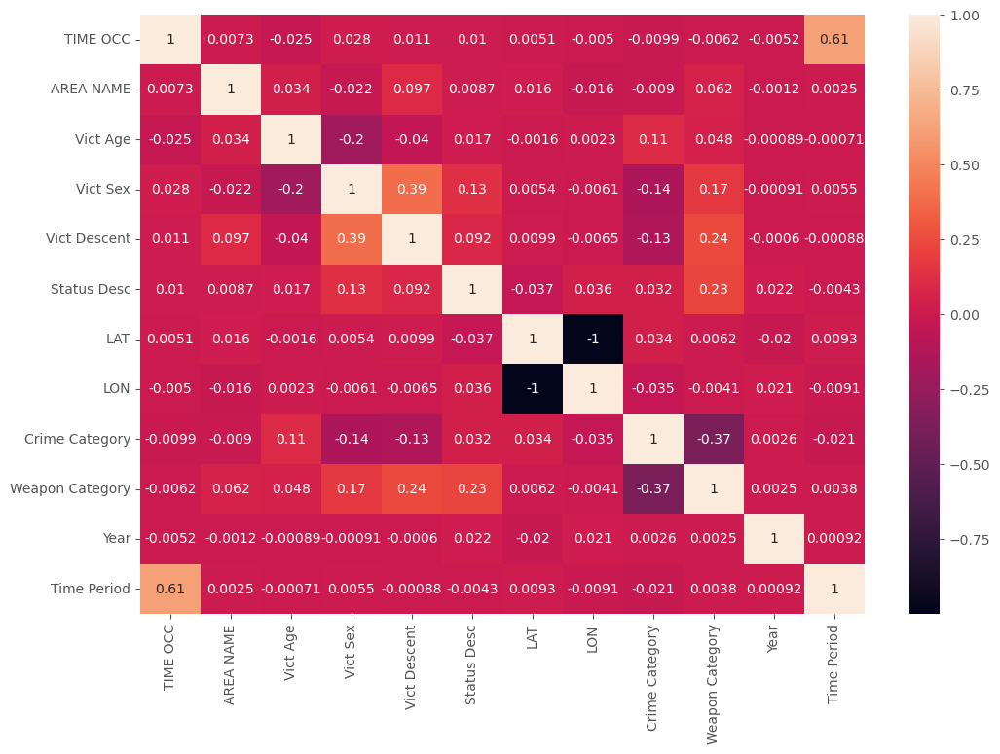

In [127]:
plt.figure(figsize=(12, 8))
sns.heatmap(df.corr(), annot=True)


In [128]:
data['DATE OCC Month'].value_counts().reset_index().sort_values('index')\
    .rename(columns={'index':'DATE OCC Month', 'DATE OCC Month':'Crime Cnt'})

,DATE OCC Month,Crime Cnt
2,2020-01-01,18476
7,2020-02-01,17251
17,2020-03-01,16155
20,2020-04-01,15676
8,2020-05-01,17197
11,2020-06-01,17022
10,2020-07-01,17110
13,2020-08-01,16864
21,2020-09-01,15623
15,2020-10-01,16478


In [129]:
pop = pd.read_excel('California_DemographicsByZipCode_sample.xlsx')

In [130]:
pop['Best Population Estimate'].isna().sum()

3

In [131]:
population = pop.loc[:, ['Geography', 'Best Population Estimate']].dropna()

In [132]:
data['AREA NAME'].unique()

array(['Southwest', 'Central', 'N Hollywood', 'Mission', 'Devonshire',
       'Northeast', 'Harbor', 'Van Nuys', 'West Valley', 'West LA',
       'Wilshire', 'Pacific', 'Rampart', '77th Street', 'Hollenbeck',
       'Southeast', 'Hollywood', 'Newton', 'Topanga', 'Foothill',
       'Olympic'], dtype=object)

In [133]:
la_areas = {
    'Southwest': '90001',
    'Central': '90002',
    'N Hollywood': '91601',
    'Mission': '91345',
    'Devonshire': '91371',
    'Northeast': '90032',
    'Harbor': '90731',
    'Van Nuys': '91401',
    'West Valley': '91303',
    'West LA': '90025',
    'Wilshire': '90005',
    'Pacific': '90066',
    'Rampart': '90006',
    '77th Street': '90044',
    'Hollenbeck': '90033',
    'Southeast': '90011',
    'Hollywood': '90028',
    'Newton': '90037',
    'Topanga': '91367',
    'Foothill': '91040',
    'Olympic': '90019'
}

In [134]:
zip_area = pd.DataFrame.from_dict(la_areas, orient='index', columns=['Zip Code']).reset_index()\
.rename(columns={'index': 'AREA NAME'})

zip_area.to_csv('zip.csv')

In [135]:
zip_pop = pd.merge(population, zip_area, left_on = 'Geography', right_on='Zip Code').drop('Zip Code', axis=1)

In [136]:
zip_pop['Year'] = 2021

In [137]:
pop_2020 = pd.read_csv('DECENNIALDP2020.DP1-Data.csv')

population_2020=pop_2020.loc[:, ['NAME', 'DP1_0001C']]

In [138]:
population_2020.columns = ['Geography', 'Best Population Estimate']

In [139]:
population_2020.drop([0, 1], inplace=True)

In [140]:
population_2020.reset_index(drop=True, inplace=True)

In [141]:
population_2020['Geography']=population_2020['Geography'].str.replace('ZCTA5 ', '')

In [142]:
population_2020['Year'] = 2020
population_2020['AREA NAME'] = zip_pop['AREA NAME']

In [143]:
dfmm =pd.merge(zip_pop, population_2020, on='Geography')

In [144]:
pop_20_21 = dfmm.loc[:, ['Geography', 'AREA NAME_x', 'Best Population Estimate_y', 'Best Population Estimate_x']]

In [145]:
pop_20_21.columns=['zip_code', 'area_name', 'population_2020', 'popolation_2021']

In [146]:
pop_20_21

,zip_code,area_name,population_2020,popolation_2021
0,90001,Southwest,55859,58245
1,90002,Central,53150,54384
2,90005,Wilshire,37987,36910
3,90006,Rampart,58229,57136
4,90011,Southeast,102308,109511
5,90019,Olympic,62002,61061
6,90025,West LA,45466,44608
7,90028,Hollywood,32330,29887
8,90032,Northeast,43506,45298
9,90033,Hollenbeck,46081,47495


In [147]:
crime_cnt = data.groupby('AREA NAME')['Year'].value_counts().unstack().reset_index()

In [148]:
crime_cnt.columns = ['area_name', 'crime_2020', 'crime_2021']

In [149]:
df = pd.merge(pop_20_21, crime_cnt, on='area_name')

In [150]:
df=df.loc[:, ['area_name', 'population_2020', 'crime_2020', 'popolation_2021', 'crime_2021']]

In [151]:
df.head()

,area_name,population_2020,crime_2020,popolation_2021,crime_2021
0,Southwest,55859,11149,58245,11376
1,Central,53150,11586,54384,13145
2,Wilshire,37987,9272,36910,9716
3,Rampart,58229,9005,57136,9441
4,Southeast,102308,10817,109511,10410


In [152]:
df.drop(['population_2020', 'popolation_2021'], axis=1).drop(18).to_csv('crim cnt in 2020_2021.csv')

In [153]:
for col in df.columns:
    if col != 'area_name':
        df[col] = pd.to_numeric(df[col])

In [154]:
df['crime_rate_2020'] = df['crime_2020'] / df['population_2020']

In [155]:
df['crime_rate_2021'] = df['crime_2021'] / df['popolation_2021']

In [156]:
df_2021 = df.loc[:, [col for col in df.columns if '2021' in col or col == 'area_name']]\
.sort_values('crime_rate_2021', ascending=False)

In [157]:
df_2021

,area_name,popolation_2021,crime_2021,crime_rate_2021
18,Devonshire,0,8478,inf
16,Mission,18752,8208,0.437713
7,Hollywood,29887,12077,0.404089
14,Foothill,21289,7023,0.329889
20,N Hollywood,34786,10897,0.313258
15,West Valley,29965,8515,0.284165
2,Wilshire,36910,9716,0.263235
1,Central,54384,13145,0.241707
12,Pacific,54913,12907,0.235045
19,Van Nuys,38974,8677,0.222636


In [158]:
df_2020 = df.loc[:, [col for col in df.columns if '2020' in col or col == 'area_name']]\
.sort_values('crime_rate_2020', ascending=False)

In [159]:
df_2020

,area_name,population_2020,crime_2020,crime_rate_2020
18,Devonshire,14,7955,568.214286
16,Mission,18895,8458,0.447632
14,Foothill,21588,7093,0.328562
7,Hollywood,32330,10140,0.313641
15,West Valley,28457,8066,0.283445
20,N Hollywood,39429,10151,0.257450
2,Wilshire,37987,9272,0.244084
19,Van Nuys,39621,8741,0.220615
1,Central,53150,11586,0.217987
12,Pacific,55304,11556,0.208954


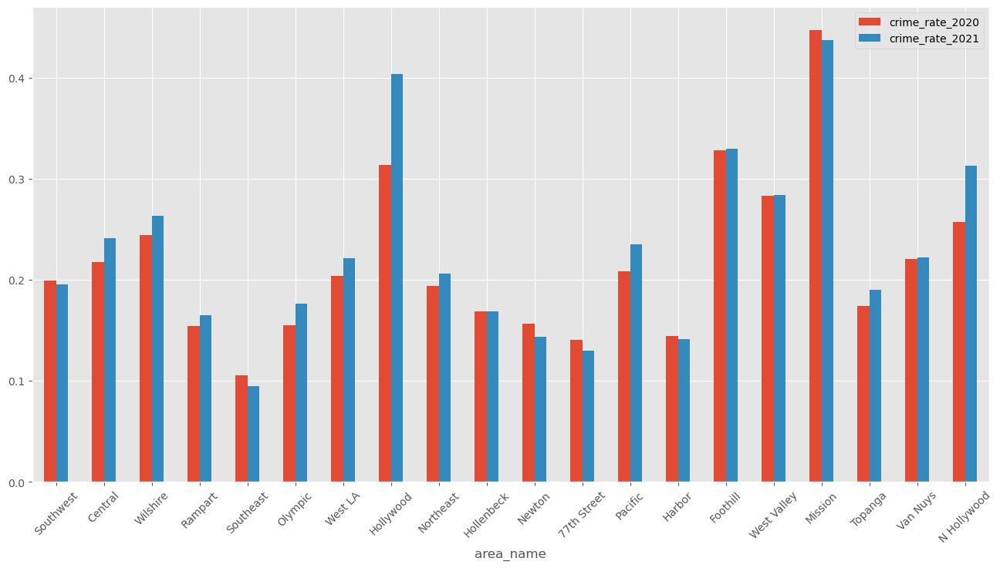

In [160]:
df.drop(18).loc[:, ['area_name', 'crime_rate_2020', 'crime_rate_2021']].set_index('area_name')\
.plot(kind='bar', figsize=(16, 8))
plt.xticks(rotation=45);

In [161]:
# px.bar(
#     df.drop(18).sort_values('crime_rate_2020', ascending=False),
#     x='area_name',
#     y=['crime_rate_2020'],
#     color='area_name'
# )

In [162]:
crime_rate = pd.merge(
    df_2020.loc[:, ['area_name','crime_rate_2020']], df_2021.loc[:, ['area_name','crime_rate_2021']], 
    on='area_name')

In [163]:
crime_rate.drop(0, inplace=True)

In [164]:
crime_rate.to_csv('crime_rate(2020_2021).csv')

In [165]:
crime_rate

,area_name,crime_rate_2020,crime_rate_2021
1,Mission,0.447632,0.437713
2,Foothill,0.328562,0.329889
3,Hollywood,0.313641,0.404089
4,West Valley,0.283445,0.284165
5,N Hollywood,0.257450,0.313258
6,Wilshire,0.244084,0.263235
7,Van Nuys,0.220615,0.222636
8,Central,0.217987,0.241707
9,Pacific,0.208954,0.235045
10,West LA,0.204285,0.221328


In [166]:
pop_20_21.loc[:, ['area_name', 'population_2020']].drop(18).to_csv('pop_2020.csv', index=False)

In [167]:
pop_20_21.loc[:, ['area_name', 'popolation_2021']].drop(18).to_csv('pop_2021.csv', index=False)

In [168]:
dfm = data.drop(['DR_NO', 'Date Rptd', 'TIME OCC', 'AREA', 'Rpt Dist No', 'Part 1-2', 'Crm Cd',
            'Crm Cd Desc', 'Mocodes', 'Premis Cd', 'Premis Desc', 'Weapon Used Cd', 'Weapon Desc',
            'Status Desc', 'Crm Cd 1', 'Crm Cd 2', 'Crm Cd 3','Crm Cd 4', 'Cross Street', 'Date Rptd', 'Date Rptd Month'], axis=1)

In [169]:
dfm.to_csv('CRIME LA.csv', index=False)

In [175]:
pd.read_csv('Crime_Data_from_2020_to_Present.csv')[:1000].to_csv('Crime_Data_from_2020_to_Present_1000.csv')